# DESI PV Y3 Group/Cluster TFR Calibration

Using the list of groups defined by Tully in [*Galaxy Groups: a 2MASS Catalog*](https://iopscience.iop.org/article/10.1088/0004-6256/149/5/171), AJ 149:171, 2015, identify DESI observations with measurements suitable for the Tully-Fisher relation. Export the SGA IDs of the TFR galaxies and apply a multi-cluster joint fit to calibrate the TFR at $0.4R_{26}$.

Version: **May 20, 2025**

**Note:** This requires using a subclassed version of `hyperfit`.

Changes I am adding:
- Adding $V_{max}$ weighting
- Implementing coordinate corrections
- Adjusting cluster membership

In [1]:
import numpy as np

import matplotlib.pyplot as plt
plt.rcParams['text.usetex'] = False
from matplotlib import cm, colors
from matplotlib.patches import Ellipse
import matplotlib as mpl

# We have more than 10 clusters, so we need to change the default color map so that they are all plotted with different colors
from cycler import cycler
plt.rcParams['axes.prop_cycle'] = cycler('color', plt.get_cmap('tab20').colors)

import ligo.skymap.plot

from astropy.table import Table, vstack, join
from astropy.coordinates import SkyCoord, Distance
from astropy.cosmology import Planck18, LambdaCDM
from astropy.wcs import WCS
from astropy.visualization.wcsaxes import SphericalCircle
from astropy import units as u
from astropy import constants as c

from scipy.spatial.distance import cdist, euclidean

import os

from corner import corner

import pickle

from tqdm import tqdm

from matplotlib.projections import get_projection_names

from desiutil.plots import init_sky

# Custom functions / classes
import sys
sys.path.insert(1, '/global/homes/s/sgmoore1/DESI_SGA/TF/')
from help_functions import adjust_lightness
from line_fits import hyperfit_line_multi
from TF_photoCorrect import BASS_corr, MW_dust, k_corr, internal_dust
from z_CMB_convert import convert_z_frame

In [2]:
# Base values for later conversions (all in units in km/s).
c_kms = c.c.to_value('km/s')
h = 1.
H0 = 100*h
q0 = 0.2

# Access SGA Jura Data

The following selections have already been applied:
* `DELTACHI2 > 25` & `ZWARN = 0` for the centers
* $10 < V < 1000$ km/s and $\Delta V / V_\text{min}$ for the observations at $0.4R_{26}$
* (eventually Visual inspection)

In [3]:
# sgapath = '/global/cfs/projectdirs/desi/science/td/pv/tfgalaxies/Y3'
sgapath = ''
# sgafits = os.path.join(sgapath, 'SGA-2020_jura_Vrot.fits')
sgafits = os.path.join(sgapath, 'SGA-2020_jura_Vrot_VI.fits')

sgatab = Table.read(sgafits)
sgatab

SGA_ID,SGA_GALAXY,GALAXY,PGC,RA_LEDA,DEC_LEDA,MORPHTYPE,PA_LEDA,D25_LEDA,BA_LEDA,Z_LEDA,SB_D25_LEDA,MAG_LEDA,BYHAND,REF,GROUP_ID,GROUP_NAME,GROUP_MULT,GROUP_PRIMARY,GROUP_RA,GROUP_DEC,GROUP_DIAMETER,BRICKNAME,RA,DEC,D26,D26_REF,PA,BA,RA_MOMENT,DEC_MOMENT,SMA_MOMENT,G_SMA50,R_SMA50,Z_SMA50,SMA_SB22,SMA_SB22.5,SMA_SB23,SMA_SB23.5,SMA_SB24,SMA_SB24.5,SMA_SB25,SMA_SB25.5,SMA_SB26,G_MAG_SB22,R_MAG_SB22,Z_MAG_SB22,G_MAG_SB22.5,R_MAG_SB22.5,Z_MAG_SB22.5,G_MAG_SB23,R_MAG_SB23,Z_MAG_SB23,G_MAG_SB23.5,R_MAG_SB23.5,Z_MAG_SB23.5,G_MAG_SB24,R_MAG_SB24,Z_MAG_SB24,G_MAG_SB24.5,R_MAG_SB24.5,Z_MAG_SB24.5,G_MAG_SB25,R_MAG_SB25,Z_MAG_SB25,G_MAG_SB25.5,R_MAG_SB25.5,Z_MAG_SB25.5,G_MAG_SB26,R_MAG_SB26,Z_MAG_SB26,SMA_SB22_ERR,SMA_SB22.5_ERR,SMA_SB23_ERR,SMA_SB23.5_ERR,SMA_SB24_ERR,SMA_SB24.5_ERR,SMA_SB25_ERR,SMA_SB25.5_ERR,SMA_SB26_ERR,G_MAG_SB22_ERR,R_MAG_SB22_ERR,Z_MAG_SB22_ERR,G_MAG_SB22.5_ERR,R_MAG_SB22.5_ERR,Z_MAG_SB22.5_ERR,G_MAG_SB23_ERR,R_MAG_SB23_ERR,Z_MAG_SB23_ERR,G_MAG_SB23.5_ERR,R_MAG_SB23.5_ERR,Z_MAG_SB23.5_ERR,G_MAG_SB24_ERR,R_MAG_SB24_ERR,Z_MAG_SB24_ERR,G_MAG_SB24.5_ERR,R_MAG_SB24.5_ERR,Z_MAG_SB24.5_ERR,G_MAG_SB25_ERR,R_MAG_SB25_ERR,Z_MAG_SB25_ERR,G_MAG_SB25.5_ERR,R_MAG_SB25.5_ERR,Z_MAG_SB25.5_ERR,G_MAG_SB26_ERR,R_MAG_SB26_ERR,Z_MAG_SB26_ERR,G_COG_PARAMS_MTOT,G_COG_PARAMS_M0,G_COG_PARAMS_ALPHA1,G_COG_PARAMS_ALPHA2,G_COG_PARAMS_CHI2,R_COG_PARAMS_MTOT,R_COG_PARAMS_M0,R_COG_PARAMS_ALPHA1,R_COG_PARAMS_ALPHA2,R_COG_PARAMS_CHI2,Z_COG_PARAMS_MTOT,Z_COG_PARAMS_M0,Z_COG_PARAMS_ALPHA1,Z_COG_PARAMS_ALPHA2,Z_COG_PARAMS_CHI2,ELLIPSEBIT,Z_DESI,ZERR_DESI,V_0p4R26,V_0p4R26_err,PHOTSYS,G_MAG_SB26_CORR,R_MAG_SB26_CORR,Z_MAG_SB26_CORR,G_MAG_SB26_ERR_CORR,R_MAG_SB26_ERR_CORR,Z_MAG_SB26_ERR_CORR,R26_kpc,R26_kpc_err,R_ABSMAG_SB26_CORR
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,kpc,kpc,
int64,bytes16,bytes29,int64,float64,float64,bytes21,float32,float32,float32,float32,float32,float32,bool,bytes13,int64,bytes35,int16,bool,float64,float64,float32,bytes8,float64,float64,float32,bytes4,float32,float32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int32,float64,float64,float64,float64,bytes32,float64,float64,float64,float64,float64,float64,float64,float64,float64
20,SGA-2020 20,SDSSJ173412.71+572041.6,3331584,263.5529355,57.34490699999999,S?,152.58,0.4487454,0.5333349,0.08364453,24.92448,18.036,False,LEDA-20181114,5,SDSSJ173412.71+572041.6,1,True,263.5529355,57.34490699999999,0.4487454,2635p572,263.55294849855886,57.344862145664294,0.4460123,SB26,152.3756,0.5778338,263.5528114673963,57.34481025685253,10.459747,5.9780583,5.751067,4.821581,1.4858595,3.4448266,5.1149526,6.748707,8.426254,9.720271,11.022999,12.0887985,13.380368,20.656942,20.044735,19.40886,19.194794,18.66572,18.231262,18.599888,18.123905,17.745926,18.256256,17.807074,17.476473,18.040592,17.60353,17.319197,17.926336,17.500519,17.228865,17.85259,17.42695,17.180876,17.811844,17.39206,17.151228,17.783718,17.36542,17.143204,0.02069058,0.026094317,0.03480586,0.05076174,0.08751116,0.10309491,0.08337893,0.10982923,0.13734566,0.031223593,0.046367057,0.0777883,0.015935475,0.020728666,0.032657374,0.012760426,0.014699919,0.022893604,0.010505663,0.011998588,0.018923525,0.010358521,0.011374098,0.017719442,0.010557283,0.0112259,0.017149422

## Compute Maximum volume for each galaxy

Since the SGA is a size-limited catalog ($D_{26} > 0.2$
 arcmin), there is a maximum volume within which each galaxy could be located to be included in the SGA. Let's calculate that maximum volume so that we can use it as a weight in the TFR calibration.

In [4]:
Planck18_h = LambdaCDM(H0=100, 
                       Om0=Planck18.Om0, 
                       Tcmb0=Planck18.Tcmb0, 
                       Neff=Planck18.Neff, 
                       m_nu=Planck18.m_nu, 
                       Ob0=Planck18.Ob0, 
                       Ode0=Planck18.Ode0)


dist = Distance(z=np.abs(sgatab['Z_DESI']), cosmology=Planck18_h)

sgatab['D26_kpc'] = 2*dist.to('kpc')*np.tan(0.5*sgatab['D26']*u.arcmin)

sgatab['DIST_MAX'] = 0.5*sgatab['D26_kpc']/np.tan(0.1*u.arcmin)

dist_max = Distance(z=0.1, cosmology=Planck18_h)

sgatab['MAX_VOL_FRAC'] = sgatab['DIST_MAX'].to('Mpc')**3 / dist_max.to('Mpc')**3

# Read in Morphological classifications

In [5]:
ai_morphtab=Table.read('/global/homes/s/sgmoore1/DESI_SGA/TF/Y3/SGAY3TFMorphologies.csv')
ai_morphtab

SGA_ID,Predicted_Type_spiral,Predicted_Type_elliptical,Predicted_Type_irregular,Predicted_Type_lenticular,Predicted_Type
float64,str6,str10,str9,str10,str10
218203.0,Other,Other,Irregular,Other,Irregular
218205.0,Other,Other,Irregular,Other,Irregular
218239.0,Other,Other,Irregular,Other,Irregular
218275.0,Other,Other,Irregular,Other,Irregular
218304.0,Spiral,Other,Other,Other,Spiral
218367.0,Other,Other,Irregular,Other,Irregular
218376.0,Spiral,Other,Other,Other,Spiral
218201.0,Other,Other,Irregular,Other,Irregular
218385.0,Spiral,Other,Other,Other,Spiral


# Combine ML morphtypes with SGA catalog

In [6]:
sgatab = join(sgatab, ai_morphtab['SGA_ID', 'Predicted_Type'], keys='SGA_ID', join_type='left')

# Rename Predicted_Type to MORPHTYPE_AI
sgatab['Predicted_Type'].name = 'MORPHTYPE_AI'

In [7]:
sgatab

SGA_ID,SGA_GALAXY,GALAXY,PGC,RA_LEDA,DEC_LEDA,MORPHTYPE,PA_LEDA,D25_LEDA,BA_LEDA,Z_LEDA,SB_D25_LEDA,MAG_LEDA,BYHAND,REF,GROUP_ID,GROUP_NAME,GROUP_MULT,GROUP_PRIMARY,GROUP_RA,GROUP_DEC,GROUP_DIAMETER,BRICKNAME,RA,DEC,D26,D26_REF,PA,BA,RA_MOMENT,DEC_MOMENT,SMA_MOMENT,G_SMA50,R_SMA50,Z_SMA50,SMA_SB22,SMA_SB22.5,SMA_SB23,SMA_SB23.5,SMA_SB24,SMA_SB24.5,SMA_SB25,SMA_SB25.5,SMA_SB26,G_MAG_SB22,R_MAG_SB22,Z_MAG_SB22,G_MAG_SB22.5,R_MAG_SB22.5,Z_MAG_SB22.5,G_MAG_SB23,R_MAG_SB23,Z_MAG_SB23,G_MAG_SB23.5,R_MAG_SB23.5,Z_MAG_SB23.5,G_MAG_SB24,R_MAG_SB24,Z_MAG_SB24,G_MAG_SB24.5,R_MAG_SB24.5,Z_MAG_SB24.5,G_MAG_SB25,R_MAG_SB25,Z_MAG_SB25,G_MAG_SB25.5,R_MAG_SB25.5,Z_MAG_SB25.5,G_MAG_SB26,R_MAG_SB26,Z_MAG_SB26,SMA_SB22_ERR,SMA_SB22.5_ERR,SMA_SB23_ERR,SMA_SB23.5_ERR,SMA_SB24_ERR,SMA_SB24.5_ERR,SMA_SB25_ERR,SMA_SB25.5_ERR,SMA_SB26_ERR,G_MAG_SB22_ERR,R_MAG_SB22_ERR,Z_MAG_SB22_ERR,G_MAG_SB22.5_ERR,R_MAG_SB22.5_ERR,Z_MAG_SB22.5_ERR,G_MAG_SB23_ERR,R_MAG_SB23_ERR,Z_MAG_SB23_ERR,G_MAG_SB23.5_ERR,R_MAG_SB23.5_ERR,Z_MAG_SB23.5_ERR,G_MAG_SB24_ERR,R_MAG_SB24_ERR,Z_MAG_SB24_ERR,G_MAG_SB24.5_ERR,R_MAG_SB24.5_ERR,Z_MAG_SB24.5_ERR,G_MAG_SB25_ERR,R_MAG_SB25_ERR,Z_MAG_SB25_ERR,G_MAG_SB25.5_ERR,R_MAG_SB25.5_ERR,Z_MAG_SB25.5_ERR,G_MAG_SB26_ERR,R_MAG_SB26_ERR,Z_MAG_SB26_ERR,G_COG_PARAMS_MTOT,G_COG_PARAMS_M0,G_COG_PARAMS_ALPHA1,G_COG_PARAMS_ALPHA2,G_COG_PARAMS_CHI2,R_COG_PARAMS_MTOT,R_COG_PARAMS_M0,R_COG_PARAMS_ALPHA1,R_COG_PARAMS_ALPHA2,R_COG_PARAMS_CHI2,Z_COG_PARAMS_MTOT,Z_COG_PARAMS_M0,Z_COG_PARAMS_ALPHA1,Z_COG_PARAMS_ALPHA2,Z_COG_PARAMS_CHI2,ELLIPSEBIT,Z_DESI,ZERR_DESI,V_0p4R26,V_0p4R26_err,PHOTSYS,G_MAG_SB26_CORR,R_MAG_SB26_CORR,Z_MAG_SB26_CORR,G_MAG_SB26_ERR_CORR,R_MAG_SB26_ERR_CORR,Z_MAG_SB26_ERR_CORR,R26_kpc,R26_kpc_err,R_ABSMAG_SB26_CORR,D26_kpc,DIST_MAX,MAX_VOL_FRAC,MORPHTYPE_AI
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,kpc,kpc,,kpc,kpc,,
float64,bytes16,bytes29,int64,float64,float64,bytes21,float32,float32,float32,float32,float32,float32,bool,bytes13,int64,bytes35,int16,bool,float64,float64,float32,bytes8,float64,float64,float32,bytes4,float32,float32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int32,float64,float64,float64,float64,bytes32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str10
20.0,SGA-2020 20,SDSSJ173412.71+572041.6,3331584,263.5529355,57.34490699999999,S?,152.58,0.4487454,0.5333349,0.08364453,24.92448,18.036,False,LEDA-20181114,5,SDSSJ173412.71+572041.6,1,True,263.5529355,57.34490699999999,0.4487454,2635p572,263.55294849855886,57.344862145664294,0.4460123,SB26,152.3756,0.5778338,263.5528114673963,57.34481025685253,10.459747,5.9780583,5.751067,4.821581,1.4858595,3.4448266,5.1149526,6.748707,8.426254,9.720271,11.022999,12.0887985,13.380368,20.656942,20.044735,19.40886,19.194794,18.66572,18.231262,18.599888,18.123905,17.745926,18.256256,17.807074,17.476473,18.040592,17.60353,17.319197,17.926336,17.500519,17.228865,17.85259,17.42695,17.180876,17.811844,17.39206,17.151228,17.783718,17.36542,17.143204,0.02069058,0.026094317,0.03480586,0.05076174,0.08751116,0.10309491,0.08337893,0.10982923,0.13734566,0.031223593,0.046367057,0.0777883,0.015935475,0.020728666,0.032657374,0.012760426,0.014699919,0.022893604,0.010505663,0.0119

# Apply Cuts Suitable for Calibrating the TFR

Requirements:
* $10~\mathrm{km/s} < V_\mathrm{rot} < 1000~\mathrm{km/s}$ at $0.4R_{26}$
* $\Delta V/V_\mathrm{min} \leq 5$
* Passed visual inspection
* $i > 45^\circ$
* Spiral-type morphology

The first three items have already been applied.

In [8]:
############################## Version to run after the morphological classifier is complete


#- Inclination cut
cosi2 = (sgatab['BA']**2 - q0**2) / (1 - q0**2)
i_min = 45. * u.degree
cosi2_max = np.cos(i_min)**2
is_good_incl = cosi2 < cosi2_max

#- Morphology cut: spiral, not S0
is_good_morph = np.zeros_like(is_good_incl, dtype=bool)
for i in range(len(sgatab)):
    try:
        if (sgatab['MORPHTYPE'][i][0] == 'S' and sgatab['MORPHTYPE'][i][:2] != 'S0') or (sgatab['MORPHTYPE_AI'][i][0] == 'S'):
            is_good_morph[i] = True
    except IndexError as e:
        continue
        
#- Morphology cut: only ML
is_good_morph_ML = np.zeros_like(is_good_morph, dtype=bool)
for i in range(len(sgatab)):
    if sgatab['MORPHTYPE_AI'][i] == 'Spiral':
        is_good_morph_ML[i] = True

#- Combine selections:
is_good_sga = is_good_incl & is_good_morph
is_good_sga_ML = is_good_incl & is_good_morph_ML

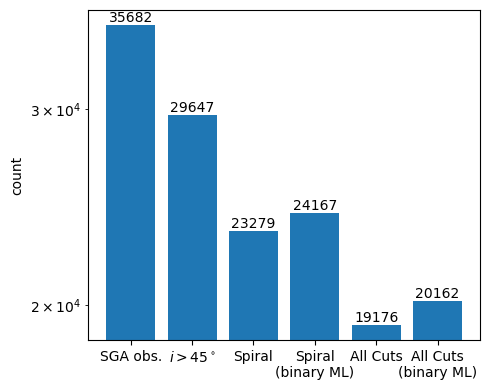

In [9]:
data = {
    'SGA obs.' : len(sgatab),
    # r'$10 < V_\mathrm{rot} < 1000$' : np.sum(is_good_velo),
    # r'$\Delta V/V_\mathrm{min}>5$' : np.sum(is_good_dv),
    r'$i > 45^\circ$' : np.sum(is_good_incl), 
    'Spiral' : np.sum(is_good_morph),
    'Spiral\n(binary ML)' : np.sum(is_good_morph_ML),
    'All Cuts' : np.sum(is_good_sga), 
    'All Cuts\n(binary ML)' : np.sum(is_good_sga_ML)
}
names = list(data.keys())
values = list(data.values())

fig, ax = plt.subplots(1, 1, figsize=(5,4), tight_layout=True)
bars = ax.bar(names, values)
ax.bar_label(bars, fmt='%d')
ax.set(ylabel='count', yscale='log', );

# fig.savefig('../../Figures/Y1/TF_Y1_SGA_Vrot_cuts.png', dpi=150);

## Add in Photometric Corrections

These are the same that are done in "TF_jura_internal-dustCorr.ipynb".

In [10]:
### Survey Offsets
sys_corr, sys_corr_err = BASS_corr(sgatab['PHOTSYS'])

In [11]:
#### Milky Way Dust Corrections
# Import E(B-V) dust map
ebv_directory = '/global/cfs/cdirs/desicollab/users/rongpu/dust/desi_ebv/public_data/maps/'
# ebv_directory = '/Users/kdouglass/Documents/Research/data/DESI/'
ebv_filename = 'desi_dust_gr_512.fits'
ebv_map = Table.read(ebv_directory + ebv_filename)

MWdust_corr, MWdust_corr_err = MW_dust(sgatab['RA'], sgatab['DEC'], ebv_map) 
MWdust_corr_err[np.isnan(MWdust_corr_err)] = 0 #flip NaN to 0

/global/homes/s/sgmoore1/DESI_SGA/TF/TF_photoCorrect.py:90: UserWarning: Warning: converting a masked element to nan.
  EBV_err[i] = ebv_map['EBV_GR_ERR'][i_ebv]


In [12]:
#### K-Corrections
zg0 = sgatab['Z_DESI'] >= 0 #ignore the few random gals with negative redshift

kcorr_zg0 = k_corr(sgatab['Z_DESI'][zg0], 
                   [sgatab['G_MAG_SB26'][zg0], sgatab['R_MAG_SB26'][zg0], sgatab['Z_MAG_SB26'][zg0]], 
                   [sgatab['G_MAG_SB26_ERR'][zg0], sgatab['R_MAG_SB26_ERR'][zg0], sgatab['Z_MAG_SB26_ERR'][zg0]], 
                   z_corr=0.1) # K-correcting to same redshift as FastSpecFit (which is what Caitlin's using for the FP)

kcorr = np.zeros([len(sgatab), 3])
kcorr[zg0] = kcorr_zg0

In [13]:
###### Internal dust correction
temp_infile = open('jura_internalDust_z0p1_mcmc.pickle', 'rb')
dust_mcmc_samples_r,_, dust_mcmc_samples_g,_, dust_mcmc_samples_z,_ = pickle.load(temp_infile)
temp_infile.close()

In [14]:
internalDust_coeffs_r = np.median(dust_mcmc_samples_r, axis=1)
internalDust_coeffs_g = np.median(dust_mcmc_samples_g, axis=1)
internalDust_coeffs_z = np.median(dust_mcmc_samples_z, axis=1)

internalDust_coeffs_err_r = np.zeros(len(internalDust_coeffs_r))
internalDust_coeffs_err_g = np.zeros(len(internalDust_coeffs_g))
internalDust_coeffs_err_z = np.zeros(len(internalDust_coeffs_z))

internalDust_coeffs_err_r[0] = np.std(dust_mcmc_samples_r[0][(-1.5 < dust_mcmc_samples_r[0]) & (dust_mcmc_samples_r[0] < 0)])
internalDust_coeffs_err_r[1] = np.std(dust_mcmc_samples_r[1][(0 < dust_mcmc_samples_r[1]) & (dust_mcmc_samples_r[1] < 1)])

internalDust_coeffs_err_g[0] = np.std(dust_mcmc_samples_g[0][(-1.5 < dust_mcmc_samples_g[0]) & (dust_mcmc_samples_g[0] < 0)])
internalDust_coeffs_err_g[1] = np.std(dust_mcmc_samples_g[1][(0 < dust_mcmc_samples_g[1]) & (dust_mcmc_samples_g[1] < 1)])

internalDust_coeffs_err_z[0] = np.std(dust_mcmc_samples_z[0][(-1.5 < dust_mcmc_samples_z[0]) & (dust_mcmc_samples_z[0] < 0)])
internalDust_coeffs_err_z[1] = np.std(dust_mcmc_samples_z[1][(0 < dust_mcmc_samples_z[1]) & (dust_mcmc_samples_z[1] < 1)])

In [15]:
internalDust_corr_r, internalDust_corr_err_r = internal_dust(sgatab['BA'], 
                                                             internalDust_coeffs_r, 
                                                             internalDust_coeffs_err_r)

internalDust_corr_g, internalDust_corr_err_g = internal_dust(sgatab['BA'], 
                                                             internalDust_coeffs_g, 
                                                             internalDust_coeffs_err_g)

internalDust_corr_z, internalDust_corr_err_z = internal_dust(sgatab['BA'], 
                                                             internalDust_coeffs_z, 
                                                             internalDust_coeffs_err_z)

In [16]:
###### Apply all these corrections
sgatab['G_MAG_SB26_CORR'] = sgatab['G_MAG_SB26'] - MWdust_corr[0] + sys_corr + kcorr[:,0] - internalDust_corr_g
sgatab['R_MAG_SB26_CORR'] = sgatab['R_MAG_SB26'] - MWdust_corr[1] + sys_corr + kcorr[:,1] - internalDust_corr_r
sgatab['Z_MAG_SB26_CORR'] = sgatab['Z_MAG_SB26'] - MWdust_corr[2] + sys_corr + kcorr[:,2] - internalDust_corr_z

sgatab['G_MAG_SB26_ERR_CORR'] = np.sqrt(sgatab['G_MAG_SB26_ERR']**2 + MWdust_corr_err[0]**2 + sys_corr_err**2 + internalDust_corr_err_g**2)
sgatab['R_MAG_SB26_ERR_CORR'] = np.sqrt(sgatab['R_MAG_SB26_ERR']**2 + MWdust_corr_err[1]**2 + sys_corr_err**2 + internalDust_corr_err_r**2)
sgatab['Z_MAG_SB26_ERR_CORR'] = np.sqrt(sgatab['Z_MAG_SB26_ERR']**2 + MWdust_corr_err[2]**2 + sys_corr_err**2 + internalDust_corr_err_z**2)

## Load SN Ia Calibrators for the TFR Zero Point

List of SNe Ia from UNION3 and Pantheon+ from Anthony Carr. Match these to the SGA Jura observations that have passed all quality cuts.

In [17]:
# zeroptpath = '/global/cfs/cdirs/desi/science/td/pv/tfgalaxies/tf_0pt/'
# zeroptab = Table.read(os.path.join(zeroptpath, 'SGA_SNmatches+secondary.fits'))

In [18]:
# #- Extract the 0-point SNe Ia that match SGA IDs in the good catalog (passed all rotation curve cuts).
# #  Merge the tables so we can use the zero point later.
# idx = np.isin(zeroptab['SGA_ID'], sgatab['SGA_ID'][is_good_sga])
# # zeroptab[['SGA_ID', 'MU_PRIMARY', 'MU_SECONDARY', 'MU_ERR', 'MU_SOURCE']][idx]

# zeroptab = join(sgatab, zeroptab[['SGA_ID', 'MU_PRIMARY', 'MU_SECONDARY', 'MU_ERR', 'MU_SOURCE']][idx], keys='SGA_ID')

# #- Write catalog to file
# # zeroptab.write('SGA_distances_0pt_iron_z0p1.fits', overwrite=True)
# zeroptab['SGA_ID', 'GALAXY', 'MU_PRIMARY', 'MU_SECONDARY', 'MU_SOURCE'].show_in_notebook()

In [19]:
# plt.figure(tight_layout=True)
# plt.hist(zeroptab['Z_DESI'])
# plt.xlabel('z');

In [20]:
# np.unique(zeroptab['MU_SOURCE'], return_counts=True)

In [21]:

# sne_coords = SkyCoord(ra=zeroptab['RA'], dec=zeroptab['DEC'], frame='icrs', unit='deg')

# fig, ax = plt.subplots(figsize=(10,4), tight_layout=True, subplot_kw={'projection' : 'mollweide'})
# _ra = np.radians(180*u.deg - sne_coords.ra)
# _dec = np.radians(sne_coords.dec)
# ax.plot(_ra, _dec, 'x', ms=10, mew=3)

# ax.set(xticklabels=[f'{_}h' for _ in np.arange(2,24, 2)][::-1])
# ax.grid(ls=':');

# # fig.savefig('../../Figures/Y1/TF_Y1_SGA_Vrot_SNIa_calibrators.png', dpi=150);

## Compute the absolute magnitude of these zero-pt calibrators based on their distance

In [22]:
# #- Clean up the distance modulus
# use_primary = zeroptab['MU_SECONDARY'] < 0
# mu = zeroptab['MU_SECONDARY']
# mu[use_primary] = zeroptab['MU_PRIMARY'][use_primary]
# # mu = zeroptab['MU_PRIMARY']

# #- Compute the absolute magnitude
# zeroptab['R_ABSMAG_SB26'] = zeroptab['R_MAG_SB26_CORR'] - mu
# zeroptab['R_ABSMAG_SB26_err'] = np.sqrt(zeroptab['R_MAG_SB26_ERR_CORR']**2 + zeroptab['MU_ERR']**2)

In [23]:
# # Save this table
# zeroptab.write('SGA-2020_jura_Vrot_VI_0ptPRIMARY_calib_z0p1.fits', overwrite=True)

In [24]:
#### Once we have already done this, we can just read in the table instead

zeroptab = Table.read('SGA-2020_jura_Vrot_VI_0ptPRIMARY_calib_z0p1.fits')

use_primary = zeroptab['MU_SECONDARY'] < 0
mu = zeroptab['MU_SECONDARY']
mu[use_primary] = zeroptab['MU_PRIMARY'][use_primary]

# Access Cluster Catalog

These clusters come from the group catalog used by Kourkchi et al. in [*CosmicFlows-4: The Calibration of Optical and Infrared Tully-Fisher Relations*](https://iopscience.iop.org/article/10.3847/1538-4357/ab901c), ApJ 896:3, 2020.

Cluster membership is defined as
1. $R_p < 1.5R_{2t}$ AND $v < V_c \pm 3\sigma_p$, OR
1. $1.5R_{2t} \leq R_p < 3R_{2t}$ AND $v < V_c \pm 2\sigma_p$

where $R_p$ is the projected distance from the center of the cluster, $R_{2t}$ is the projected cluster second turnaround radius, $\sigma_p$ is the projected velocity dispersion of the cluster, and $V_c$ is the average heliocentric radial velocity of the cluster.

In [25]:
clusters_T = Table.read('../Tully15-Table3.fits')
clusters_T[:5]

f_Nest,Nest,Nmb,PGC1,SGLON,SGLAT,logLK,<Vcmba>,DM,sigV,R2t,sigP,Mlum,CF
,,,,deg,deg,[Lsun],km / s,mag,km / s,Mpc,km / s,Msun,
int16,int32,int16,int32,float64,float64,float64,int32,float64,int16,float64,int16,float64,float64
1,100001,136,44715,89.6226,8.1461,13.15,7331,34.33,886,2.129,1045,1.710e+15,1.65
1,100002,197,41220,103.0008,-2.3248,12.69,1491,30.87,670,1.440,707,5.290e+14,1.00
1,100003,113,43296,156.2336,-11.5868,12.75,3873,32.94,822,1.520,746,6.230e+14,1.12
1,100004,81,58265,71.5103,49.7851,13.16,9424,34.87,740,2.153,1057,1.770e+15,2.26
1,100005,61,36487,92.0255,-10.4950,12.78,6987,34.22,707,1.560,766,6.730e+14,1.58


In [26]:
######## Remove the clusters that have been found to likely not be real clusters as they are contained within other clusters in this sample


# overlaps = Table.read('All_Overlapped_Clusters.txt', format='ascii.commented_header')
# overlaps['Cluster_Id']

In [27]:
# Convert Tully's central cluster velocities to heliocentric frame (to match the DESI redshift frame)
cls_coords = SkyCoord(clusters_T['SGLON'], clusters_T['SGLAT'], unit='deg', frame='supergalactic').icrs
z_hel = convert_z_frame(clusters_T['<Vcmba>']/c.c.to('km/s'), cls_coords.ra.deg, cls_coords.dec.deg, corrtype='-full')
clusters_T['HRV'] = z_hel*c_kms
clusters_T[:5]

f_Nest,Nest,Nmb,PGC1,SGLON,SGLAT,logLK,<Vcmba>,DM,sigV,R2t,sigP,Mlum,CF,HRV
,,,,deg,deg,[Lsun],km / s,mag,km / s,Mpc,km / s,Msun,,
int16,int32,int16,int32,float64,float64,float64,int32,float64,int16,float64,int16,float64,float64,float64
1,100001,136,44715,89.6226,8.1461,13.15,7331,34.33,886,2.129,1045,1.710e+15,1.65,7056.410096941048
1,100002,197,41220,103.0008,-2.3248,12.69,1491,30.87,670,1.440,707,5.290e+14,1.00,1161.7922735623201
1,100003,113,43296,156.2336,-11.5868,12.75,3873,32.94,822,1.520,746,6.230e+14,1.12,3587.4600297854763
1,100004,81,58265,71.5103,49.7851,13.16,9424,34.87,740,2.153,1057,1.770e+15,2.26,9399.655364870352
1,100005,61,36487,92.0255,-10.4950,12.78,6987,34.22,707,1.560,766,6.730e+14,1.58,6653.443936152573


In [28]:
clusters_K = Table.read('../Kourkchi17-Table2.fits.gz')
clusters_K[:5]

PGC1,PGC1+,Nm,GLON,GLAT,SGLON,SGLAT,Ksmag,logK,HRV,VLS,Nd,Dist,e_Dist,sigmaL,sigmaV,R2t,Rg,logMK,logMd
,,,deg,deg,deg,deg,mag,[Lsun],km / s,km / s,,Mpc,%,km / s,km / s,Mpc,Mpc,[Msun],[Msun]
int32,int32,int16,float64,float64,float64,float64,float64,float64,int16,int16,int16,float64,int16,int16,int16,float64,float64,float64,float64
43296,43296,191,302.2241,21.6465,156.3251,-11.5819,4.61,12.71,3407,3142,59,36.96,3,595,800,1.612,0.893,14.624,14.717
46618,43296,30,307.8738,19.2865,159.6426,-6.8008,6.07,12.11,3340,3086,5,37.57,7,350,307,0.950,0.745,13.936,13.808
45174,43296,34,306.0424,32.5707,146.1941,-6.0422,6.42,11.96,3292,3059,4,44.03,8,307,300,0.833,0.693,13.764,13.756
40498,43296,24,297.5648,23.0823,153.9019,-15.4648,6.48,11.92,3258,2986,4,28.45,6,296,170,0.801,0.607,13.713,13.207
43557,43296,22,302.9333,36.4075,141.8602,-7.7062,6.82,11.81,3296,3066,7,39.89,8,267,163,0.724,0.428,13.582,13.017


In [29]:
# Rename columns to match Tully's catalog
clusters_K['Nm'].name = 'Nmb'
clusters_K['sigmaL'].name = 'sigP'
clusters_K['sigmaV'].name = 'sigV'

# Convert from distance to distance modulus
clusters_K['DM'] = 5*np.log10(clusters_K['Dist'].value) + 25

# Define NestID
clusters_K['Nest'] = np.char.add('3', clusters_K['PGC1'].astype('str')).astype('int')

/tmp/ipykernel_1682770/1224197170.py:7: RuntimeWarning: divide by zero encountered in log10
  clusters_K['DM'] = 5*np.log10(clusters_K['Dist'].value) + 25


## Combine these two cluster catalogs

In [30]:
# Determine which clusters in Kourkchi's table are already in Tully's
K_keep = np.ones(len(clusters_T), dtype=bool)

for i in range(len(clusters_K)):
    K_keep = K_keep & (clusters_T['PGC1'] != clusters_K['PGC1'][i])

clusters_all = vstack([clusters_T[K_keep], clusters_K])

clusters = clusters_all['Nest', 'Nmb', 'PGC1', 'SGLON', 'SGLAT', 'DM', 'sigV', 'sigP', 'R2t', 'HRV'][clusters_all['Nmb'] >= 5]
len(clusters)

1321

In [31]:
# mask = np.in1d(clusters['Nest'], overlaps['Cluster_Id'])
# clusters = clusters[~mask]
# clusters

# Find Cluster Membership

Identify SGA galaxies in the list of galaxy groups from Tully (2015).

Loop through the data and keep only clusters where DESI has at least 20 galaxies with TF measurements passing all quality cuts.

In [32]:
#- Sky coordinates of SGA galaxies that passed quality selection
sgatab_sel = sgatab[is_good_sga]

sga_coords = SkyCoord(sgatab_sel['RA'], sgatab_sel['DEC'], unit='deg')
z_sga_desi = sgatab_sel['Z_DESI']

In [33]:
sga_clusters = {}
m_dwarf_clusters = {}
n_cluster_min = 10

#- Convert distance moduli to velocities [in km/s]
velos = 100 * 10**(0.2*(clusters['DM'] - 25)) / (1 + clusters['HRV']/c_kms)
# Tully used H0 = 100 km/s/Mpc, which is why we are using 100 here and not H0

# for cluster in tqdm(clusters[['Nest', 'SGLON', 'SGLAT', 'R2t', 'sigP', 'DM']]):
for i in tqdm(range(len(clusters))):
    nest_id = clusters['Nest'][i]
    
    #- Sky coordinates of cluster
    cls_coord = SkyCoord(clusters['SGLON'][i], 
                         clusters['SGLAT'][i], 
                         unit='deg', 
                         frame='supergalactic')

    #- Cluster turnaround radius, velocity dispersion, and distance modulus
    R2t = clusters['R2t'][i]
    # sigP = clusters['sigP'][i]
    sigV = clusters['sigV'][i]
    velo = velos[i]

    #- Apply cuts on angular separation
    sep = cls_coord.separation(sga_coords)
    R2t_angle_1p5 = np.arctan(1.5*R2t / (velo/H0)) * u.radian
    R2t_angle_3 = np.arctan(3*R2t / (velo/H0)) * u.radian

    #- Apply cluster cuts.
    in_cluster_1 = (sep < R2t_angle_1p5) & (z_sga_desi*c_kms > velo - 3*sigV) & (z_sga_desi*c_kms < velo + 3*sigV)
    in_cluster_2 = (sep >= R2t_angle_1p5) & (sep < R2t_angle_3) & (z_sga_desi*c_kms > velo - 2*sigV) & (z_sga_desi*c_kms < velo + 2*sigV)
    in_cluster = in_cluster_1 | in_cluster_2

    if np.any(in_cluster) and np.sum(in_cluster) >= n_cluster_min:
        if nest_id in sga_clusters:
            warnings.warn(f'Cluster ID {nest_id} already encountered.', RuntimeWarning)
        sga_clusters[nest_id] = list(sgatab_sel['SGA_ID'][in_cluster])
        m_dwarf_clusters[nest_id] = -17 + mu

/tmp/ipykernel_1682770/3929555731.py:27: RuntimeWarning: divide by zero encountered in double_scalars
  R2t_angle_1p5 = np.arctan(1.5*R2t / (velo/H0)) * u.radian
/tmp/ipykernel_1682770/3929555731.py:28: RuntimeWarning: divide by zero encountered in double_scalars
  R2t_angle_3 = np.arctan(3*R2t / (velo/H0)) * u.radian
100%|██████████| 1321/1321 [00:20<00:00, 65.67it/s]


In [34]:
for i, (cluster_id, sga_ids) in enumerate(sga_clusters.items()):
    print(f'{i+1:2d} {cluster_id:7d} {len(sga_ids):3d} galaxies')

 1  100001  34 galaxies
 2  100004  96 galaxies
 3  100005  19 galaxies
 4  100007 132 galaxies
 5  100020  11 galaxies
 6  100025  13 galaxies
 7  100030  12 galaxies
 8  100032  21 galaxies
 9  100041  29 galaxies
10  100042  22 galaxies
11  100046  26 galaxies
12  100049  15 galaxies
13  100051  17 galaxies
14  100056  12 galaxies
15  100058  20 galaxies
16  100067  37 galaxies
17  100070  21 galaxies
18  100077  80 galaxies
19  100081  21 galaxies
20  100085  13 galaxies
21  100087  12 galaxies
22  100094  23 galaxies
23  100096  14 galaxies
24  100098  16 galaxies
25  100110  27 galaxies
26  100125  29 galaxies
27  100132  31 galaxies
28  100135  16 galaxies
29  100137  23 galaxies
30  100142  12 galaxies
31  100168  17 galaxies
32  100178  11 galaxies
33  100188  11 galaxies
34  100191  10 galaxies
35  100207  10 galaxies
36  100220  26 galaxies
37  100221  29 galaxies
38  100282  80 galaxies
39  100284  11 galaxies
40  100287  10 galaxies
41  100289  11 galaxies
42  100292  15 g

## Sanity Checks: Plot Cluster Positions and Galaxy Coordinates

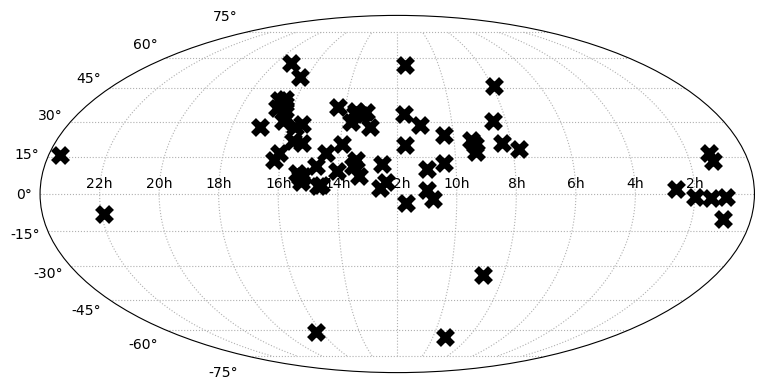

In [35]:
nest_ids = np.asarray(list(sga_clusters.keys()))
idx = np.in1d(clusters['Nest'], nest_ids)
cluster_lon = clusters['SGLON'][idx]
cluster_lat = clusters['SGLAT'][idx]
cluster_coords = SkyCoord(cluster_lon, cluster_lat, unit='deg', frame='supergalactic')

fig, ax = plt.subplots(figsize=(10,4), tight_layout=True, subplot_kw={'projection' : 'mollweide'})
for coord in cluster_coords:
    _ra = np.radians(180*u.deg - coord.transform_to('icrs').ra)
    _dec = np.radians(coord.transform_to('icrs').dec)
    ax.plot(_ra, _dec, 'kx', ms=10, mew=5)

ax.set(xticklabels=[f'{_}h' for _ in np.arange(2,24, 2)][::-1])
ax.grid(ls=':');

# fig.savefig('../../Figures/Y1/TF_Y1_SGA_Vrot_clusters_20241203.png', dpi=150);


In [36]:
def geometric_median(X, eps=1e-6):
    """Compute the weighted geometric median of a set of points using Weiszfeld's algorithm.

    From https://github.com/scoutant/l1-median. Weiszfeld's algorithm may fail to converge
    if a guess is located on top of one of the initial points. If that occurs, move the guess.
    
    A summary of other algorithms is provided in
    https://www.cs.cmu.edu/~./glmiller/Publications/Papers/CLMPS16.pdf.

    Parameters
    ----------
    X : ndarray
        list of sample points (n-D), given as a 2D array
    eps : float
        Tolerance for convergence to the median.

    Returns
    -------
    y : ndarray
        First n-D estimate of the median satisfying the tolerance.
    """
    #- See with the geometric mean
    y = np.mean(X,0)
    while True:
        #- Compute Euclidean distances. Move away to avoid any null distances.
        while np.any(cdist(X,[y])==0):
            y +=0.1*np.ones(len(y))
            
        #- Weights that are the inverse of the distances from current estimate to the observations
        W = 1/cdist(X,[y]) # element-wise
        
        #- Update is the weighted average of the observations
        y1 = np.sum(W*X,0)/np.sum(W) # sum along axis 0
        if euclidean(y,y1) < eps:
            return y1
        y = y1

def cluster_median_coords(galaxy_coords):
    """Compute the geometric median coordinate of the galaxies in a cluster.

    Parameters
    ----------
    galaxy_coords : ndarray
        List of SkyCoords for galaxies in a cluster or group.

    Returns
    -------
    gal_median : SkyCoord
        Coordinates of the geometric median.
    """
    #- Pack the clusters coordinates into an array of Cartesian coordinates
    galcoords = []
    for galaxy in galaxy_coords:
        galcoords.append(galaxy.represent_as('cartesian').get_xyz())
    galcoords = np.asarray(galcoords)

    #- Compute the geometric median.
    gm = geometric_median(galcoords)
    lonlat = SkyCoord(x=gm[0], y=gm[1], z=gm[2], representation_type='cartesian').transform_to('icrs').represent_as('unitspherical')
    gal_median = SkyCoord(ra=lonlat.lon.deg, dec=lonlat.lat.deg, unit='degree', frame='icrs')

    return gal_median

In [37]:
def plot_cluster_members(clusters, cluster_id, sgacat, sga_ids):
    """Generate a set of diagnostic plots for the members of a cluster.
    """
    
    #- Get cluster sky coordinates
    idx = np.in1d(clusters['Nest'], cluster_id)
    cluster_lon = clusters['SGLON'][idx][0]
    cluster_lat = clusters['SGLAT'][idx][0]
    cluster_mu = clusters['DM'][idx][0]
    cluster_dist = 10 * 10**(0.2*cluster_mu) * 1e-6
    cluster_v = H0*cluster_dist
    cluster_sigma = clusters['sigP'][idx][0]
    cluster_R2t = clusters['R2t'][idx][0]
    cluster_R2t_1p5 = np.arctan(1.5*cluster_R2t / (cluster_v/H0)) * u.radian
    cluster_R2t_3 = np.arctan(3*cluster_R2t / (cluster_v/H0)) * u.radian
    cluster_R2t_4 = np.arctan(4*cluster_R2t / (cluster_v/H0)) * u.radian
    
    cluster_coord = SkyCoord(cluster_lon, cluster_lat, unit='deg', frame='supergalactic').transform_to('icrs')

    print(cluster_coord)
    print(f'{cluster_v} +/- {cluster_sigma} km/s')

    #- Get SGA galaxy coordinates and median of observations
    idx = np.in1d(sgacat['SGA_ID'], sga_ids)
    z_sga = sgacat['Z_DESI'][idx]
    z_sorted = np.sort(z_sga)
    ngal = len(z_sorted)
    z_sga_median = np.mean(z_sorted[ngal//2:ngal//2 + 2]) if (ngal % 2 == 0) else z_sorted[ngal//2]
    
    sga_coords = SkyCoord(ra=sgacat['RA'][idx], dec=sgacat['DEC'][idx], unit='deg', frame='icrs')
    sga_coords_median = cluster_median_coords(sga_coords)

    #- Plot the angular coordinates and redshifts
    fig = plt.figure(figsize=(12,8), tight_layout=True)
    ax = plt.subplot(231, projection='astro degrees zoom', center=cluster_coord, radius=cluster_R2t_4)
    ax.grid()

    ax.plot(sga_coords.ra.deg, sga_coords.dec.deg, 'o', transform=ax.get_transform('world'), alpha=0.5, label=f'{cluster_id}')
    ax.plot(sga_coords_median.ra.deg, sga_coords_median.dec.deg, 'rD', transform=ax.get_transform('world'), ms=5, mew=5)
    ax.plot(cluster_coord.ra.deg, cluster_coord.dec.deg, 'kx', transform=ax.get_transform('world'), ms=10, mew=5)

    inner = SphericalCircle(cluster_coord, cluster_R2t_1p5, transform=ax.get_transform('world'), edgecolor='tab:blue', linestyle='dotted', facecolor='none')
    ax.add_patch(inner)

    outer = SphericalCircle(cluster_coord, cluster_R2t_3, transform=ax.get_transform('world'), edgecolor='tab:blue', linestyle='solid', facecolor='none')
    ax.add_patch(outer)
    
    ax.set(xlabel=r'$\alpha$ [deg]', ylabel=r'$\delta$ [deg]')

    #- Plot the Dec vs redshift and velocity limits
    ax = plt.subplot(232)
    ax.plot(z_sga, sga_coords.dec.deg, 'o', alpha=0.5, label=f'{cluster_id}')
    ax.plot(z_sga_median, sga_coords_median.dec.deg, 'rD', ms=5, mew=5)
    ax.plot(cluster_v/c_kms, cluster_coord.dec.deg, 'kx', ms=10, mew=5)

    decmin = np.min(sga_coords.dec.deg) - 0.5
    decmax = np.max(sga_coords.dec.deg) + 0.5

    ax.vlines(np.asarray([cluster_v-3*cluster_sigma,
                          cluster_v+3*cluster_sigma,
                          cluster_v-2*cluster_sigma,
                          cluster_v+2*cluster_sigma])/c_kms,
              decmin, decmax,
              colors='tab:blue',
              linestyles=['solid', 'solid', 'dotted', 'dotted'])

    ax.set(xlabel='redshift',
           ylabel=r'$\delta$ [deg]',
           ylim=(decmin, decmax))

    #- Plot the RA vs redshift and velocity limits
    ax = plt.subplot(233)
    ax.plot(sga_coords.ra.deg, z_sga, 'o', alpha=0.5, label=f'{cluster_id}')
    ax.plot(sga_coords_median.ra.deg, z_sga_median, 'rD', ms=5, mew=5)
    ax.plot(cluster_coord.ra.deg, cluster_v/c_kms, 'kx', ms=10, mew=5)

    ramin = np.min(sga_coords.ra.deg) - 0.5
    ramax = np.max(sga_coords.ra.deg) + 0.5

    ax.hlines(np.asarray([cluster_v-3*cluster_sigma,
                          cluster_v+3*cluster_sigma,
                          cluster_v-2*cluster_sigma,
                          cluster_v+2*cluster_sigma])/c_kms,
              ramin, ramax,
              colors='tab:blue',
              linestyles=['solid', 'solid', 'dotted', 'dotted'])

    ax.set(ylabel='redshift',
           xlabel=r'$\alpha$ [deg]',
           xlim=(ramax, ramin))

    #- Histograms of RA, Dec, and redshift:
    delta_angle = 0.75
    
    ax = plt.subplot(234)
    ax.hist(sga_coords.ra.deg, bins=np.arange(ramin, ramax+delta_angle, delta_angle))
    ax.vlines(sga_coords_median.ra.deg, 0, 50, colors='r', linestyles='dotted')
    ax.vlines(cluster_coord.ra.deg, 0, 50, colors='k', linestyles='dotted')
    ax.set(xlabel=r'$\alpha$ [deg]',
           xlim=(ramax+delta_angle, ramin-delta_angle),
           ylabel='count',
           ylim=(0,10))

    ax = plt.subplot(235)
    ax.hist(sga_coords.dec.deg, bins=np.arange(decmin, decmax+delta_angle, delta_angle))
    ax.vlines(sga_coords_median.dec.deg, 0, 50, colors='r', linestyles='dotted')
    ax.vlines(cluster_coord.dec.deg, 0, 50, colors='k', linestyles='dotted')
    ax.set(xlabel=r'$\delta$ [deg]',
           xlim=(decmax+delta_angle, decmin-delta_angle),
           ylabel='count',
           ylim=(0,10))

    dz = 0.0025
    zmin = np.min(np.round(z_sga, 2)) - 4*dz
    zmax = np.max(np.round(z_sga, 2)) + 4*dz

    ax = plt.subplot(236)
    ax.hist(z_sga, bins=np.arange(zmin, zmax + dz, dz))
    ax.vlines(z_sga_median, 0, 50, colors='r', linestyles='dotted')
    ax.vlines(cluster_v/c_kms, 0, 50, colors='k', linestyles='dotted')
    ax.set(xlabel='redshift',
           xlim=(zmin, zmax),
           ylabel='count',
           ylim=(0,10))

    fig.suptitle(f'TF Iron Observations of Tully Group {cluster_id}')

    return fig

<SkyCoord (ICRS): (ra, dec) in deg
    (194.75582168, 27.93269246)>
7345.138681571143 +/- 1045 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (246.98584602, 40.22479396)>
9418.895965228417 +/- 1057 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (176.07089679, 20.00355552)>
6982.324040771719 +/- 766 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (241.05808519, 16.95441739)>
11587.773561551261 +/- 1385 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (167.684214, 28.49303999)>
10423.174293933058 +/- 834 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (254.66744684, 27.90476299)>
10665.961212302589 +/- 801 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (125.16049518, 21.02858537)>
5105.049999754064 +/- 406 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (210.6977648, 9.35549827)>
6637.430704019089 +/- 449 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (244.29362068, 35.02777805)>
9418.895965228417 +/- 627 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (220.13676059, 3.3706831)>
8433.347577642775 +/- 545 km/s
<SkyCoord 

/tmp/ipykernel_1682770/1761111452.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12,8), tight_layout=True)


<SkyCoord (ICRS): (ra, dec) in deg
    (139.23844455, 20.18221015)>
8994.975815300362 +/- 510 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (245.46482264, 37.76598219)>
9727.47223776964 +/- 565 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (164.82189669, 10.09092567)>
11066.237839776675 +/- 744 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (199.15794579, 7.32962624)>
15417.004529495585 +/- 1049 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (227.93611812, 7.39421399)>
14125.375446227554 +/- 835 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (200.4086906, 33.00451867)>
12022.64434617413 +/- 701 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (221.50861765, 11.62813453)>
9289.663867799383 +/- 543 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (242.98891897, 30.43076085)>
15488.166189124857 +/- 1047 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (140.73455867, 22.35848467)>
10375.284158180126 +/- 545 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (235.52374226, 27.98581814)>
10092.528860766874 +/- 509 km/s
<SkyCo

/tmp/ipykernel_1682770/1761111452.py:14: RuntimeWarning: divide by zero encountered in double_scalars
  cluster_R2t_1p5 = np.arctan(1.5*cluster_R2t / (cluster_v/H0)) * u.radian
/tmp/ipykernel_1682770/1761111452.py:15: RuntimeWarning: divide by zero encountered in double_scalars
  cluster_R2t_3 = np.arctan(3*cluster_R2t / (cluster_v/H0)) * u.radian
/tmp/ipykernel_1682770/1761111452.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  cluster_R2t_4 = np.arctan(4*cluster_R2t / (cluster_v/H0)) * u.radian


<SkyCoord (ICRS): (ra, dec) in deg
    (244.09332814, -60.90166956)>
0.0 +/- 320 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (131.28772823, -33.83366621)>
0.0 +/- 206 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (140.19898283, -63.55780713)>
0.0 +/- 198 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (214.31858855, 36.42507459)>
0.0 +/- 229 km/s


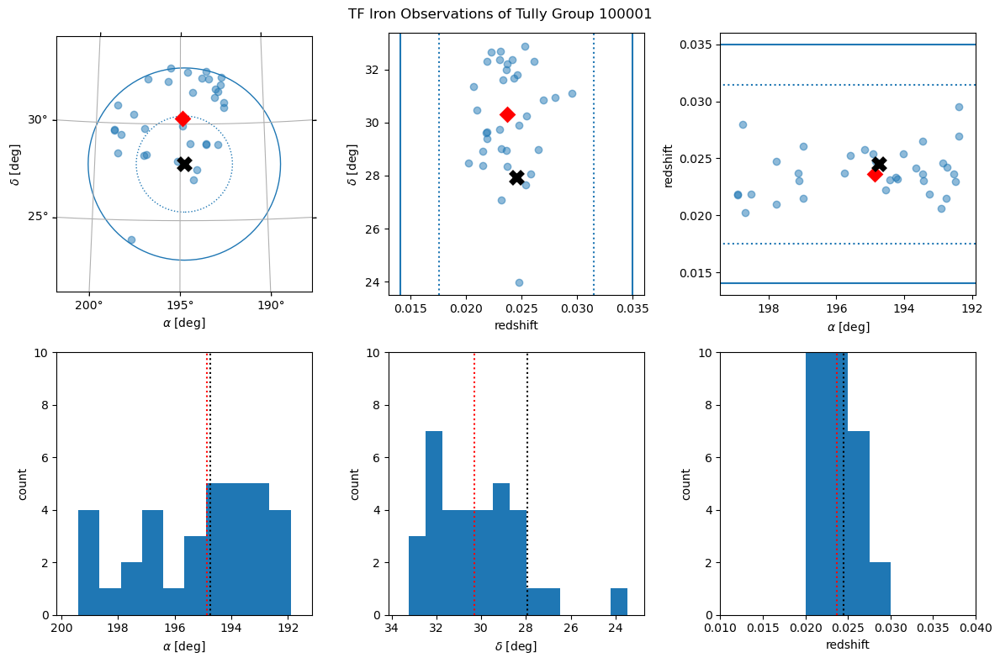

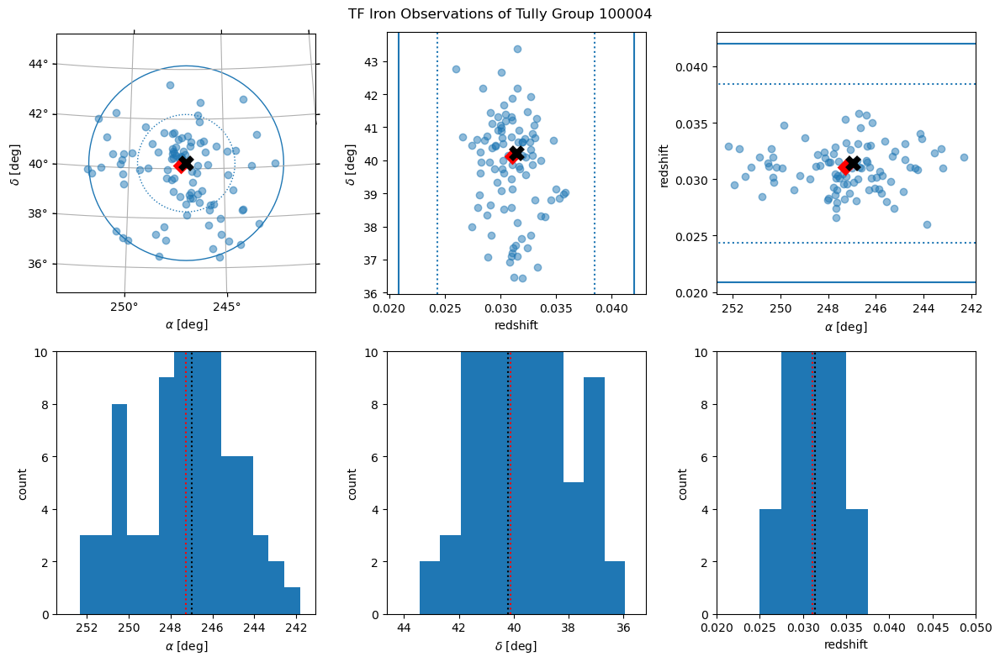

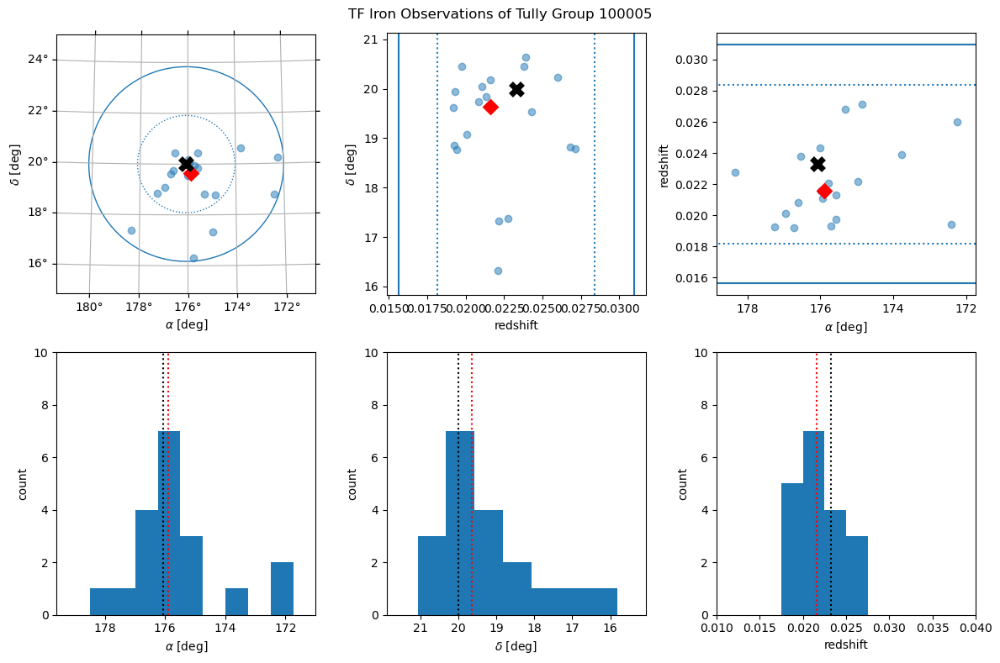

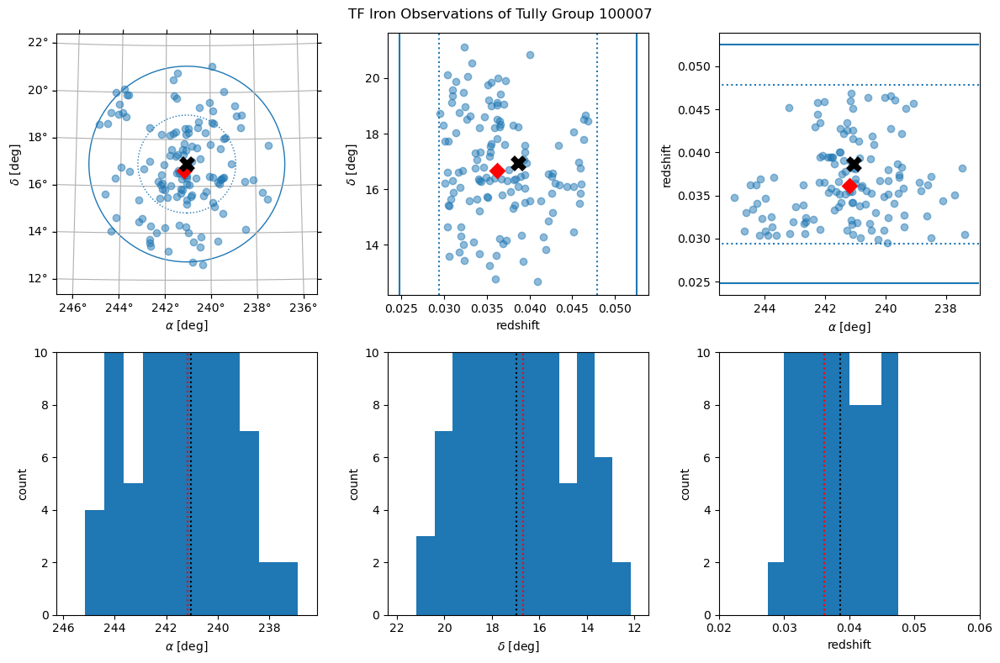

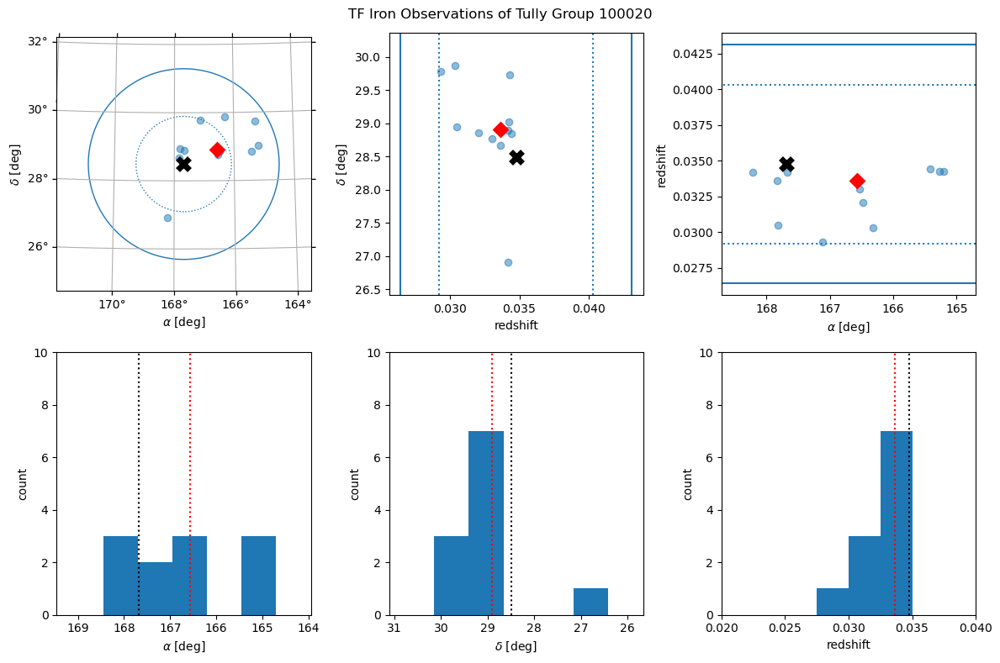

...

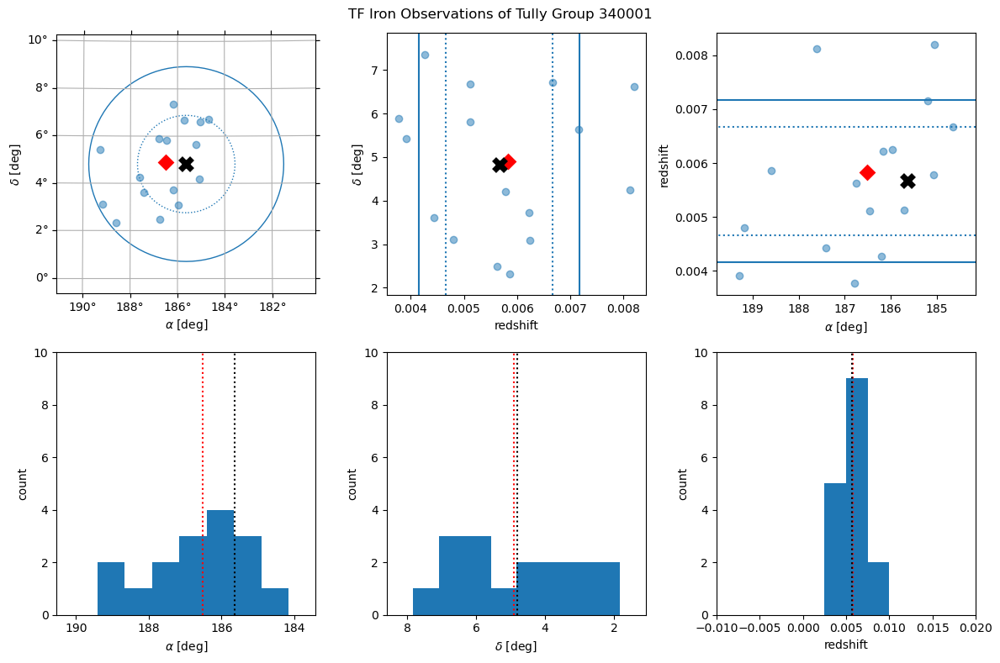

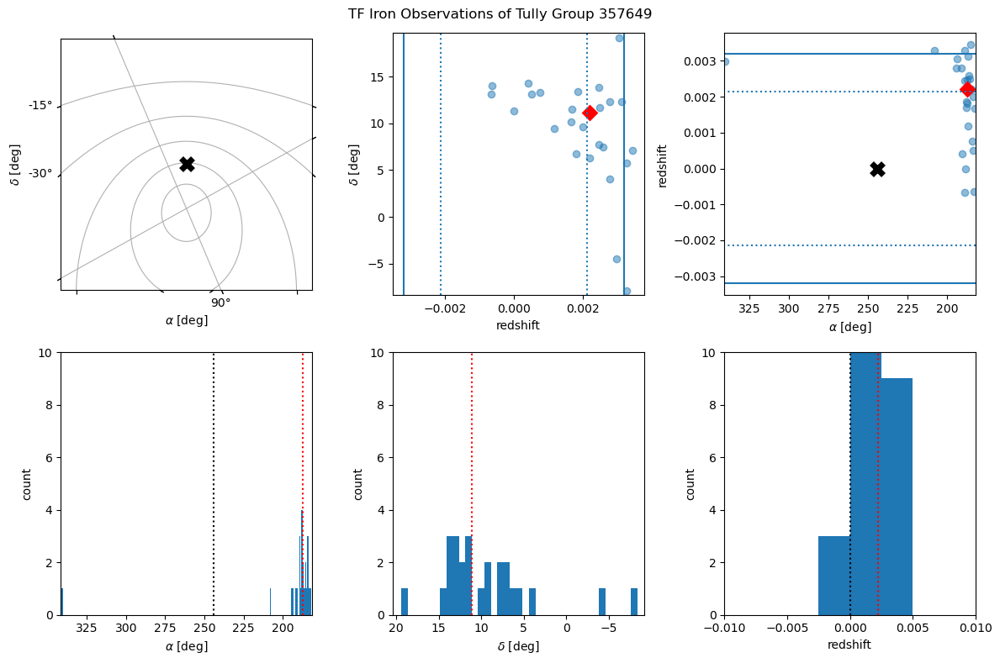

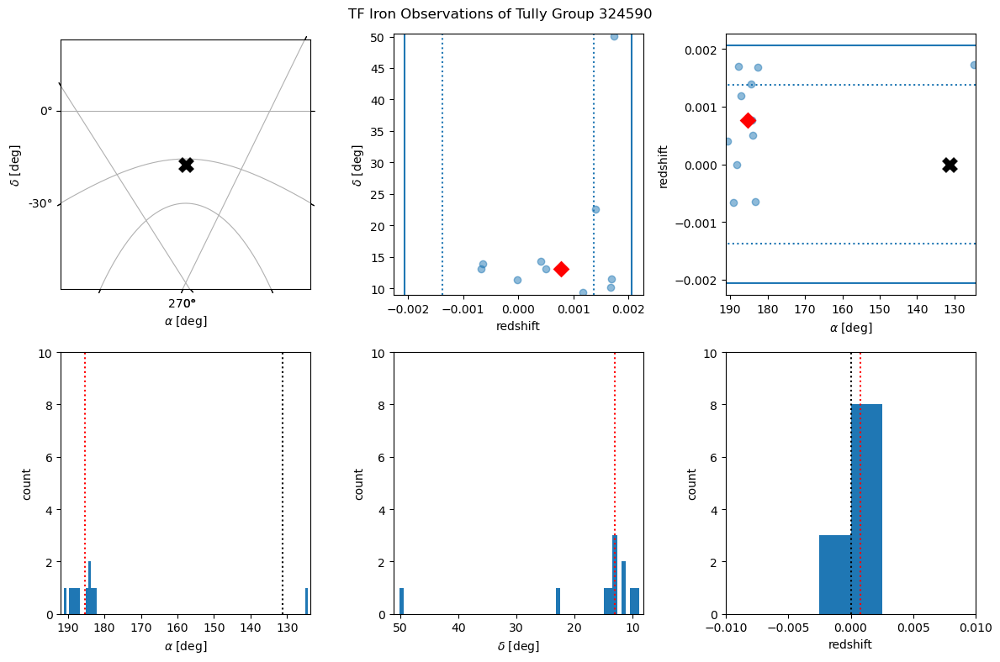

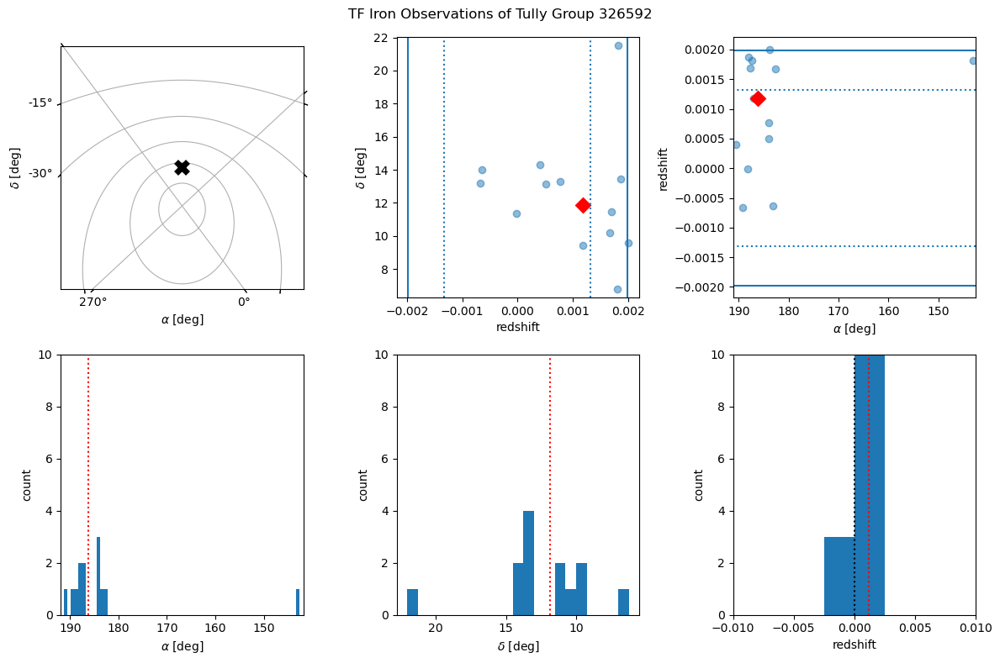

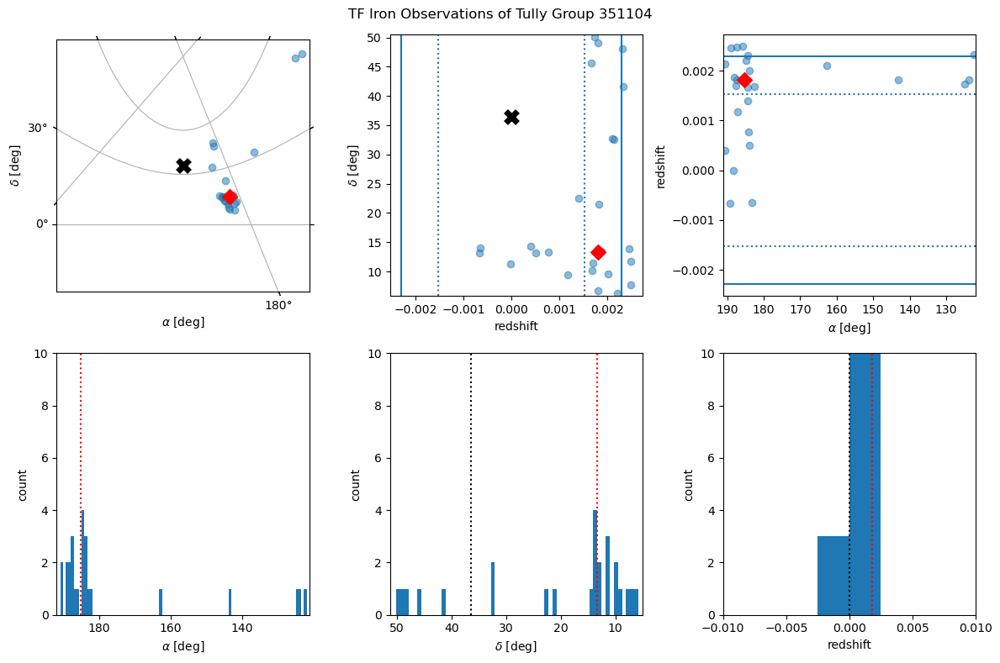

In [38]:
for cluster_id in sga_clusters.keys():
    fig = plot_cluster_members(clusters, cluster_id, sgatab_sel, sga_clusters[cluster_id])

# Apply Cluster Selection

Plot the clusters as a function of $\Delta\theta/\angle(R_{2t})$ versus $\Delta v/\sigma_P$. The quantities are:
* $\Delta\theta$: the angular separation between the median position of the DESI observations and the cluster center reported in Tully 2015.
* $\angle(R_{2t})$: the angular projection of the cluster second turnaround radius.
* $\Delta v = v_\text{cluster} - v_\text{SGA,median}$.
* $\sigma_P$: the velocity dispersion of the cluster, reported in Tully 2015.

A reasonable selection appears to be

1. $\Delta v/ \sigma_P < 1$
2. $\Delta\theta / R_{2t} < 1$

100001        85.027 km/s     886.000 km/s       0.096       2.370 deg       1.699 deg       0.930
100004       182.620 km/s     740.000 km/s       0.247       0.242 deg       1.350 deg       0.119
100005       355.772 km/s     707.000 km/s       0.503       0.408 deg       1.308 deg       0.208
100007       321.318 km/s    1261.000 km/s       0.255       0.306 deg       1.448 deg       0.141
100020         3.691 km/s     794.000 km/s       0.005       1.066 deg       0.965 deg       0.736
100025       144.011 km/s     449.000 km/s       0.321       1.370 deg       0.908 deg       1.006
100030       400.081 km/s     367.000 km/s       1.090       0.532 deg       0.942 deg       0.376
100032       476.123 km/s     479.000 km/s       0.994       0.486 deg       0.807 deg       0.402
100041       289.858 km/s     589.000 km/s       0.492       0.222 deg       0.802 deg       0.184
100042       143.833 km/s     451.000 km/s       0.319       0.274 deg       0.774 deg       0.236
100046    

/tmp/ipykernel_1682770/1817881169.py:14: RuntimeWarning: divide by zero encountered in double_scalars
  cluster_R2t_angle = np.arctan(cluster_R2t / (cluster_v/H0)) * u.radian
/tmp/ipykernel_1682770/1817881169.py:15: RuntimeWarning: divide by zero encountered in double_scalars
  cluster_R2t_1p5 = np.arctan(1.5*cluster_R2t / (cluster_v/H0)) * u.radian
/tmp/ipykernel_1682770/1817881169.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  cluster_R2t_3 = np.arctan(3*cluster_R2t / (cluster_v/H0)) * u.radian
/tmp/ipykernel_1682770/1817881169.py:17: RuntimeWarning: divide by zero encountered in double_scalars
  cluster_R2t_4 = np.arctan(4*cluster_R2t / (cluster_v/H0)) * u.radian


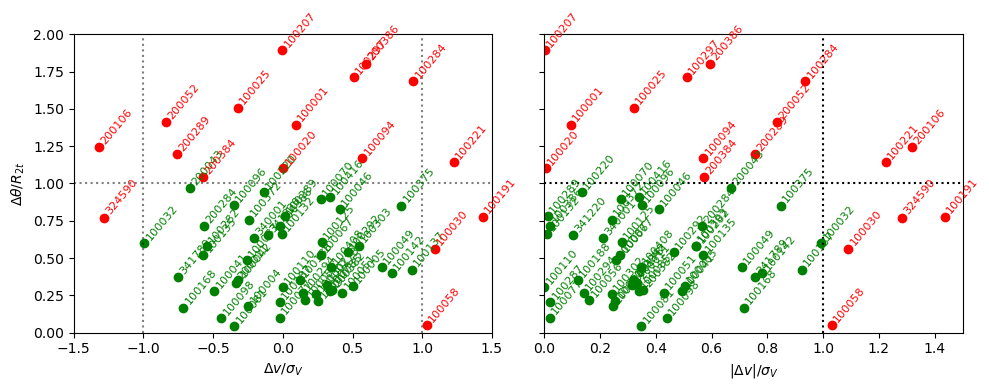

In [39]:
keep_cluster = []
dv_sigmaV = []
dtheta_R2t = []
cluster_ids = []

for cluster_id, sga_ids in sga_clusters.items():
    #- Get cluster sky coordinates
    idx = np.in1d(clusters['Nest'], cluster_id)
    cluster_lon = clusters['SGLON'][idx][0]
    cluster_lat = clusters['SGLAT'][idx][0]
    cluster_v = 100 * 10**(0.2*(clusters['DM'][idx][0] - 25)) / (1 + clusters['HRV'][idx][0]/c_kms)
    cluster_sigma = clusters['sigV'][idx][0]
    cluster_R2t = clusters['R2t'][idx][0]
    cluster_R2t_angle = np.arctan(cluster_R2t / (cluster_v/H0)) * u.radian
    cluster_R2t_1p5 = np.arctan(1.5*cluster_R2t / (cluster_v/H0)) * u.radian
    cluster_R2t_3 = np.arctan(3*cluster_R2t / (cluster_v/H0)) * u.radian
    cluster_R2t_4 = np.arctan(4*cluster_R2t / (cluster_v/H0)) * u.radian
    
    cluster_coord = SkyCoord(cluster_lon, cluster_lat, unit='deg', frame='supergalactic').transform_to('icrs')
    
    #- Get SGA galaxy coordinates and median of observations
    idx = np.in1d(sgatab['SGA_ID'], sga_ids)
    z_sga = sgatab['Z_DESI'][idx]
    z_sorted = np.sort(z_sga)
    ngal = len(z_sorted)
    z_sga_median = np.mean(z_sorted[ngal//2:ngal//2 + 2]) if (ngal % 2 == 0) else z_sorted[ngal//2]
    
    sga_coords = SkyCoord(ra=sgatab['RA'][idx], dec=sgatab['DEC'][idx], unit='deg', frame='icrs')
    sga_coords_median = cluster_median_coords(sga_coords)

    #- Compute the angle and velocity ratios:
    delta_v = cluster_v - c_kms*z_sga_median
    _dv_sigV = delta_v / cluster_sigma
    dv_sigmaV.append(_dv_sigV)

    delta_theta = sga_coords_median.separation(cluster_coord).to('rad')
    _dth_R2t = delta_theta / cluster_R2t_angle
    dtheta_R2t.append(_dth_R2t)

    cluster_ids.append(cluster_id)

    #- Print results:
    print(f'{cluster_id:<8d}{np.abs(delta_v):12.3f} km/s{cluster_sigma:12.3f} km/s{np.abs(delta_v)/cluster_sigma:12.3f}' \
          f'{delta_theta.to("deg"):12.3f}{cluster_R2t_angle.to("deg"):12.3f}{delta_theta / (1.5*cluster_R2t_angle):12.3f}')

dv_sigmaV = np.asarray(dv_sigmaV)
dtheta_R2t = np.asarray(dtheta_R2t)
cluster_ids = np.asarray(cluster_ids)

#- Apply selection
dvcut = 1
dthcut = 1

select = (np.abs(dv_sigmaV) < dvcut) & (dtheta_R2t < dthcut)

#- Plot results

fig, axes = plt.subplots(1, 2, figsize=(10,4), sharey=True, tight_layout=True)
ax = axes[0]
ax.scatter(dv_sigmaV[select], dtheta_R2t[select], color='g')
for _dv, _dth, _id in zip(dv_sigmaV[select], dtheta_R2t[select], cluster_ids[select]):
    ax.annotate(f'{_id}', (_dv, _dth+0.02), fontsize=8, rotation=50, color='green')

ax.scatter(dv_sigmaV[~select], dtheta_R2t[~select], color='r')
for _dv, _dth, _id in zip(dv_sigmaV[~select], dtheta_R2t[~select], cluster_ids[~select]):
    ax.annotate(f'{_id}', (_dv, _dth+0.02), fontsize=8, rotation=50, color='red')

ax.axvline(dvcut, ls=':', color='k', alpha=0.5)
ax.axvline(-dvcut, ls=':', color='k', alpha=0.5)
ax.axhline(dthcut, ls=':', color='k', alpha=0.5)
ax.set(xlabel=r'$\Delta v/\sigma_V$',
       xlim=(-1.5, 1.5),
       ylabel=r'$\Delta\theta/R_{2t}$',
       ylim=(0,2))

ax = axes[1]
ax.scatter(np.abs(dv_sigmaV[select]), dtheta_R2t[select], color='g')
for _dv, _dth, _id in zip(np.abs(dv_sigmaV[select]), dtheta_R2t[select], cluster_ids[select]):
    ax.annotate(f'{_id}', (_dv, _dth+0.02), fontsize=8, rotation=50, color='green')

ax.scatter(np.abs(dv_sigmaV[~select]), dtheta_R2t[~select], color='r')
for _dv, _dth, _id in zip(np.abs(dv_sigmaV[~select]), dtheta_R2t[~select], cluster_ids[~select]):
    ax.annotate(f'{_id}', (_dv, _dth+0.02), fontsize=8, rotation=50, color='red')

ax.axvline(dvcut, ls=':', color='k')
ax.axvline(-dvcut, ls=':', color='k')
ax.axhline(dthcut, ls=':', color='k')
ax.set(xlabel=r'$|\Delta v|/\sigma_V$',
       xlim=(0, 1.5));


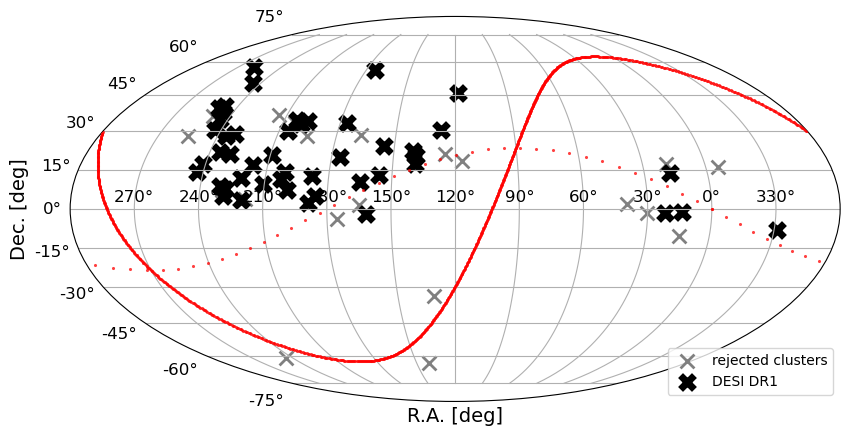

In [40]:
nest_ids = np.asarray(list(sga_clusters.keys()))
good_idx = np.in1d(clusters['Nest'], nest_ids[select])
bad_idx = np.in1d(clusters['Nest'], nest_ids[~select])
good_cluster_coords = SkyCoord(clusters['SGLON'][good_idx], clusters['SGLAT'][good_idx], unit='deg', frame='supergalactic')
bad_cluster_coords = SkyCoord(clusters['SGLON'][bad_idx], clusters['SGLAT'][bad_idx], unit='deg', frame='supergalactic')

ax = init_sky()

ax.scatter(ax.projection_ra(bad_cluster_coords.transform_to('icrs').ra.value), 
           ax.projection_dec(bad_cluster_coords.transform_to('icrs').dec.value), 
           marker='x', 
           s=100,
           linewidth=2,
           color='gray', 
           label='rejected clusters')
ax.scatter(ax.projection_ra(good_cluster_coords.transform_to('icrs').ra.value), 
           ax.projection_dec(good_cluster_coords.transform_to('icrs').dec.value), 
           marker='x', 
           s=100,
           linewidth=5,
           color='black', 
           label='DESI DR1')

ax.xaxis.label.set_size(14)
ax.yaxis.label.set_size(14)

plt.legend(loc='lower right')

plt.tick_params(axis='both', which='major', labelsize=12);

# plt.savefig('../../Figures/Y1/iron_clusters_AnthonyUpdates_sky.png', dpi=150, facecolor='none');

In [41]:
for i, (cluster_id, sga_ids) in enumerate(sga_clusters.items()):
    print(f'{i+1:2d} {cluster_id:7d} {len(sga_ids):3d} galaxies  {"Y" if select[i] else "N"}')

 1  100001  34 galaxies  N
 2  100004  96 galaxies  Y
 3  100005  19 galaxies  Y
 4  100007 132 galaxies  Y
 5  100020  11 galaxies  N
 6  100025  13 galaxies  N
 7  100030  12 galaxies  N
 8  100032  21 galaxies  Y
 9  100041  29 galaxies  Y
10  100042  22 galaxies  Y
11  100046  26 galaxies  Y
12  100049  15 galaxies  Y
13  100051  17 galaxies  Y
14  100056  12 galaxies  Y
15  100058  20 galaxies  N
16  100067  37 galaxies  Y
17  100070  21 galaxies  Y
18  100077  80 galaxies  Y
19  100081  21 galaxies  Y
20  100085  13 galaxies  Y
21  100087  12 galaxies  Y
22  100094  23 galaxies  N
23  100096  14 galaxies  Y
24  100098  16 galaxies  Y
25  100110  27 galaxies  Y
26  100125  29 galaxies  Y
27  100132  31 galaxies  Y
28  100135  16 galaxies  Y
29  100137  23 galaxies  Y
30  100142  12 galaxies  Y
31  100168  17 galaxies  Y
32  100178  11 galaxies  Y
33  100188  11 galaxies  Y
34  100191  10 galaxies  N
35  100207  10 galaxies  N
36  100220  26 galaxies  Y
37  100221  29 galaxies  N
3

## Plot Clusters that Failed

In [42]:
# for cluster_id in sga_clusters.keys():
#     if cluster_id in cluster_ids[~select]:
#         fig = plot_cluster_members(clusters, cluster_id, sgatab_sel, sga_clusters[cluster_id])
#         # fig.savefig(f'../../Figures/Y1/TF_Y1_cluster_{cluster_id}_reject.png', dpi=150);

## Plot Clusters that Passed

In [43]:
# for cluster_id in sga_clusters.keys():
#     if cluster_id in cluster_ids[select]:
#         fig = plot_cluster_members(clusters, cluster_id, sgatab_sel, sga_clusters[cluster_id])
#         # fig.savefig(f'../../Figures/Y1/TF_Y1_cluster_{cluster_id}_accept.png', dpi=150);

# Build the Calibration Table of SGA Galaxies in Clusters

In [44]:
caltab = None    # Table of selected clusters and SGA galaxies
rejtab = None    # Table of clusters failing the selection

for cluster_id, sga_ids in sga_clusters.items():
    if cluster_id in cluster_ids[select]:
        idx = np.in1d(sgatab['SGA_ID'], sga_ids)
        clustertab = sgatab[idx]
        clustertab['CLUSTER_ID'] = cluster_id
        
        caltab = clustertab if caltab is None else vstack([caltab, clustertab])
    else:
        idx = np.in1d(sgatab['SGA_ID'], sga_ids)
        clustertab = sgatab[idx]
        clustertab['CLUSTER_ID'] = cluster_id
        
        rejtab = clustertab if rejtab is None else vstack([rejtab, clustertab])

# caltab.write('SGA-2020_jura_Vrot_cluster_calib_VI_full_sample.fits', overwrite=True)
caltab[['CLUSTER_ID', 'SGA_ID', 'R_MAG_SB26_CORR', 'R_MAG_SB26_ERR_CORR', 'V_0p4R26', 'V_0p4R26_err']]

CLUSTER_ID,SGA_ID,R_MAG_SB26_CORR,R_MAG_SB26_ERR_CORR,V_0p4R26,V_0p4R26_err
int64,float64,float64,float64,float64,float64
100004,761.0,15.741410433148591,0.1564862057602736,59.996288640093425,19.56891007723405
100004,11814.0,15.243254819797912,0.13067783030188557,123.5356671604,9.674575986720395
100004,13048.0,15.816402526005728,0.17493868415294445,99.40858422024502,8.759627815621856
100004,32760.0,14.01142502824925,0.17528320569539876,175.00404760977867,0.9008539581872044
100004,33741.0,13.602952165083588,0.17278788180781737,190.28843106541558,12.018196055337523
100004,55599.0,15.167497408421804,0.11806026469711861,126.6629857260743,2.0534318427317415
100004,92466.0,15.060255005919934,0.11991202405618903,107.29977328068988,2.26749703738664
100004,99148.0,16.845762264662515,0.09175806351812703,85.59576308694984,7.699847464489684
100004,99240.0,15.468037965536674,0.11745449895710187,103.86844792503732,4.100293100457044


In [45]:
# Save SGA IDs for each cluster that is part of the calibration (for Alex's Bayesian calibration)
for cluster in np.unique(caltab['CLUSTER_ID']):
    output_filename = 'output_' + str(cluster) + '.txt'
    # SGA_IDs_in_cluster = Table()
    # SGA_IDs_in_cluster['SGA_ID'] = c_4r_in_cluster[i]
    caltab[['SGA_ID']][caltab['CLUSTER_ID'] == cluster].write(output_filename, 
                                                              format='ascii.commented_header', 
                                                              overwrite=True)

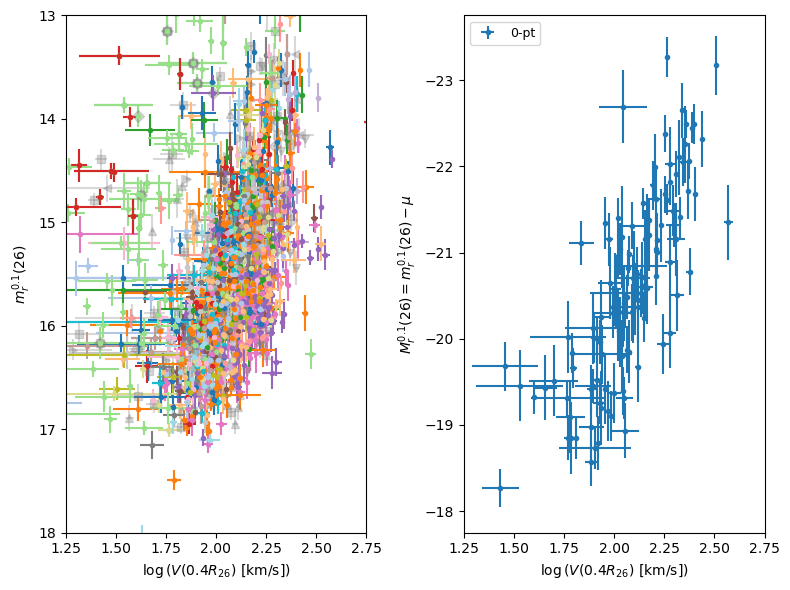

In [46]:
fig, axes = plt.subplots(1, 2, figsize=(8,6), sharex=True, tight_layout=True)

logV0 = 0

ax = axes[0] 

#- Plot galaxies with failed cluster selections.
_cluster_ids = np.unique(rejtab['CLUSTER_ID'])
markers = 'sDv^<>'
for j, _cluster_id in enumerate(_cluster_ids):
    select_cluster = np.in1d(rejtab['CLUSTER_ID'], _cluster_id)

    #- Store independent variable for each cluster
    logv = np.log10(rejtab['V_0p4R26'][select_cluster].data) - logV0
    logv_err = 0.434*rejtab['V_0p4R26_err'][select_cluster].data / rejtab['V_0p4R26'][select_cluster].data

    #- Store dependent variable for each cluster
    mr26 = rejtab['R_MAG_SB26_CORR'][select_cluster].data
    mr26_err = rejtab['R_MAG_SB26_ERR_CORR'][select_cluster].data
    
    ax.errorbar(x=logv, y=mr26, xerr=logv_err, yerr=mr26_err, 
                fmt=markers[j % 6], markersize=6, color='gray', alpha=0.3, label=f'{_cluster_id} (rej.)')

#- Plot galaxies and clusters passing all selections.
_cluster_ids = np.unique(caltab['CLUSTER_ID'])

for _cluster_id in _cluster_ids:
    select_cluster = np.in1d(caltab['CLUSTER_ID'], _cluster_id)

    #- Store independent variable for each cluster
    logv = np.log10(caltab['V_0p4R26'][select_cluster].data) - logV0
    logv_err = 0.434*caltab['V_0p4R26_err'][select_cluster].data / caltab['V_0p4R26'][select_cluster].data

    #- Store dependent variable for each cluster
    mr26 = caltab['R_MAG_SB26_CORR'][select_cluster].data
    mr26_err = caltab['R_MAG_SB26_ERR_CORR'][select_cluster].data
    
    ax.errorbar(x=logv, y=mr26, xerr=logv_err, yerr=mr26_err, fmt='.', label=f'{_cluster_id}')

ax.set(xlim=[1.25, 2.75],
       xlabel=r'$\log{(V(0.4R_{26})~[\mathrm{km/s}]}$)',
       ylim=[18, 13],
       ylabel=r'$m_r^{0.1} (26)$')
# ax.legend(loc='upper left', fontsize=9)

#- Plot the 0-pt calibrators
ax = axes[1]

logv = np.log10(zeroptab['V_0p4R26'].data) - logV0
logv_err = 0.434*zeroptab['V_0p4R26_err'].data / zeroptab['V_0p4R26'].data
mr26 = zeroptab['R_ABSMAG_SB26'].data
mr26_err = zeroptab['R_ABSMAG_SB26_err'].data

ax.errorbar(x=logv, y=mr26, xerr=logv_err, yerr=mr26_err, fmt='.', label='0-pt')
ax.set(xlim=[1.25, 2.75],
       xlabel=r'$\log{(V(0.4R_{26})~[\mathrm{km/s}]}$)',
       ylim=[-17.75, -23.75],
       ylabel=r'$M_r^{0.1}(26) = m_r^{0.1}(26) - \mu$')
ax.legend(loc='upper left', fontsize=9);

# # fig.savefig('Figures/TF_Y3_cluster_calibration_0pt.png', dpi=150);

# Apply the Joint TFR Fit

In [47]:
#- Extract successful clusters
_cluster_ids = np.unique(caltab['CLUSTER_ID'])
m = len(_cluster_ids)

#- Pack the results into arrays data and cov.
logV, logV_err = [], []
mag, mag_err = [], []
weights = []

# logV0 = 2.25
logV0 = np.median(np.concatenate([np.log10(caltab['V_0p4R26']), 
                                  np.log10(zeroptab['V_0p4R26'])]))
print('logV0 =', logV0)

# Start with the zero-point calibrators
logV.append(np.log10(zeroptab['V_0p4R26']) - logV0)
logV_err.append(0.434*zeroptab['V_0p4R26_err'] / zeroptab['V_0p4R26'])
mag.append(zeroptab['R_ABSMAG_SB26'])
mag_err.append(zeroptab['R_ABSMAG_SB26_err'])
weights.append(np.array(1/zeroptab['MAX_VOL_FRAC']))

#- Loop over the SGA clusters
for k, _cluster_id in enumerate(_cluster_ids):
    select_cluster = np.in1d(caltab['CLUSTER_ID'], _cluster_id)
    logV.append(np.log10(caltab['V_0p4R26'][select_cluster]) - logV0)
    logV_err.append(0.434*caltab['V_0p4R26_err'][select_cluster] / caltab['V_0p4R26'][select_cluster])
    mag.append(caltab['R_MAG_SB26_CORR'][select_cluster])
    mag_err.append(caltab['R_MAG_SB26_ERR_CORR'][select_cluster])
    weights.append(np.array(1/caltab['MAX_VOL_FRAC'][select_cluster]))

logV0 = 2.076234609555491


In [48]:
bounds = [[-20, 0]]                    # Bounds on a (slope)
bounds += [(-40,0)] + m*[(-20, 20)]    # Bounds on b (intercepts: 0-pt + clusters)
bounds += [(0,5)]                      # Bounds on sigma

results = hyperfit_line_multi(logV, mag, logV_err, mag_err, bounds, scatter=1)

a, b, sig_tfr, cov_tfr, tfr_mcmc_samples, hf_tfr = results

     fun: -122764.01250221897
     jac: array([-3.92901714e-01,  8.67294076e-01, -5.82076561e-02,  5.82076561e-03,
        1.39698375e-01,  2.91038280e-02, -2.61934452e-02, -2.21189093e-01,
       -2.61934452e-02,  1.60071054e-01, -2.91038280e-03, -8.73114841e-03,
       -3.28873257e-01, -2.61934452e-02,  6.69388045e-02, -1.22236078e-01,
       -1.45519140e-02, -2.91038280e-03,  2.32830624e-02,  2.03726796e-02,
        4.94765077e-02,  1.86264500e-01, -1.45519140e-01, -3.20142109e-02,
        2.00816414e-01, -4.07453593e-02, -7.85803357e-02, -1.45519140e-01,
        4.07453593e-02, -3.49245937e-02,  1.57160671e-01,  5.82076561e-03,
        2.91038280e-03,  9.89530154e-02, -1.19325695e-01, -8.44011013e-02,
        2.76486366e-01,  1.04773781e-01,  8.14907185e-02, -9.31322498e-02,
        2.27009859e-01, -2.91038280e-03,  2.32830624e-02,  1.62981437e-01,
       -2.12457945e-01,  2.91038280e-03, -5.23868905e-02, -6.63567280e-01,
       -4.22005507e-02, -3.48809406e+00])
 message: 'Optimiz

100%|██████████| 1000/1000 [08:06<00:00,  2.06it/s]


Niterations/Max Iterations:  1000 / 100000
Integrated ACT/Min Convergence Iterations:  [ 95.37247416  95.78821713  98.34176639  96.22760639  96.90890605
  95.2776366   94.07011426  99.82680541  95.54284922  99.05118446
  97.11933367  97.04990833  96.85379359  96.7455753  100.55022747
  96.58804145  99.44866836  98.76170378  92.65468709  95.45627583
  98.05841829  99.11385148  96.0038047   98.28733556  96.34340794
  93.63954578  95.11900965  97.91598358  96.76793005  96.53947595
  94.34109155 102.32305902  99.17783151  98.50533301  95.37908882
  98.80586506  96.50043396  94.64892972  97.0683528   99.9775532
 100.71799156  96.40522526  93.48894018  97.322695    95.97438726
  99.1828229   98.8305947  104.79047404  97.06497261  97.07309986] / 5239.523701866463


100%|██████████| 1000/1000 [07:56<00:00,  2.10it/s]


Niterations/Max Iterations:  2000 / 100000
Integrated ACT/Min Convergence Iterations:  [145.98626631 123.90286736 129.20796219 142.93206024 129.94745661
 140.84365414 139.33267605 143.06360895 142.92583591 143.68852252
 140.97186582 146.98077867 131.0079958  142.87314044 133.11165498
 137.7691298  140.96078637 144.17188664 151.2794255  143.49167948
 136.56529081 133.97819011 134.99956294 144.90555489 132.22209334
 147.4532129  145.92355875 147.95228242 145.92800038 139.93239965
 129.98409781 147.32088824 143.55958716 140.34963957 150.15387926
 146.05223825 147.92560079 143.83975601 144.41185449 143.91449828
 146.19616904 146.28036106 139.0391994  141.09914557 142.40384446
 140.02185932 147.29551624 130.34454651 147.92725926 147.88213006] / 7563.971275153989


100%|██████████| 1000/1000 [07:40<00:00,  2.17it/s]


Niterations/Max Iterations:  3000 / 100000
Integrated ACT/Min Convergence Iterations:  [169.765208   159.73649879 167.64567371 174.30153252 158.5445682
 179.35130446 167.93183485 172.28871076 168.66444484 160.3957505
 178.57903024 170.78085434 163.27335975 177.99371483 168.57816267
 165.73969066 173.80631998 170.05316598 171.72972356 171.34676776
 177.09807555 170.27052053 172.79759658 180.13099488 174.4044826
 176.55093459 169.18965059 174.71183925 171.34490275 161.78789383
 167.04554374 182.04708139 170.14084997 170.10357521 178.42294459
 173.7738769  176.03623391 180.04825244 167.3433292  172.09532344
 165.73938269 165.3465712  171.97435552 172.76264152 168.79096203
 177.20042259 176.79406859 165.65965875 176.15965012 177.29777198] / 9102.354069439505


100%|██████████| 1000/1000 [07:39<00:00,  2.17it/s]


Niterations/Max Iterations:  4000 / 100000
Integrated ACT/Min Convergence Iterations:  [189.71617714 172.64209818 179.93438379 195.14428496 169.9912444
 192.66998438 201.33553647 201.50881074 194.33661202 201.33650156
 202.06172127 190.08464444 184.7964803  196.3907565  175.59991774
 188.06126998 193.91156962 199.84498294 199.85543259 195.91598305
 198.11618591 184.96852905 191.59757812 194.97354507 190.02688578
 193.59852318 200.94886969 207.13355909 206.44034359 195.6025945
 175.8716323  202.39639394 198.51066993 187.94587158 198.92875457
 200.57596499 191.01290751 197.32251516 201.78826455 191.76700158
 198.47148739 193.08904999 188.89747341 186.40366308 190.2489229
 205.40103173 192.0203222  176.58331396 183.39802354 192.80178967] / 10356.677954682218


100%|██████████| 1000/1000 [07:38<00:00,  2.18it/s]


Niterations/Max Iterations:  5000 / 100000
Integrated ACT/Min Convergence Iterations:  [218.10756066 190.26526981 206.70557678 222.13047876 223.22038823
 216.81238643 231.79034775 229.38341895 226.9660407  223.52159778
 231.38495529 231.86809796 222.97854363 234.79545704 219.34362902
 232.57384009 227.46431892 224.57530806 227.39455708 213.75120541
 212.72256208 225.16091738 214.88892081 230.976024   213.19687116
 232.94606152 230.2666905  222.14985781 227.43609298 225.53144937
 216.57556396 218.96539174 221.16877735 210.96403285 217.50385085
 223.34860911 239.80837574 218.7447712  227.04496408 218.8481117
 216.19948141 212.57600155 223.61362722 213.75712275 215.59564065
 217.42126004 228.85111184 221.00007133 231.39496785 213.68708356] / 11990.418787200302


100%|██████████| 1000/1000 [07:44<00:00,  2.15it/s]


Niterations/Max Iterations:  6000 / 100000
Integrated ACT/Min Convergence Iterations:  [234.01196453 216.52903555 218.02117811 236.17140692 229.99390426
 227.04996898 252.44936905 231.27334749 228.74559889 228.71654479
 234.57894023 242.83147056 227.06456078 229.95451726 223.98617011
 233.7986248  226.0505275  237.51221873 246.47768972 220.28820153
 220.93341201 225.70225309 234.27500212 237.78142815 226.37323102
 238.17818552 227.85210234 227.59048438 232.70057998 254.58027676
 230.46145819 253.56541546 233.3084935  228.47196244 227.56118071
 244.51359401 242.32068884 235.30450265 245.89139958 225.03909664
 244.55539618 248.99888296 251.84166684 240.39202833 227.73074384
 233.35437807 245.99579937 218.49307551 232.1018009  226.28788828] / 12729.013837996054


100%|██████████| 1000/1000 [07:45<00:00,  2.15it/s]


Niterations/Max Iterations:  7000 / 100000
Integrated ACT/Min Convergence Iterations:  [245.2005695  251.35933743 241.46099338 257.8751451  238.811306
 242.1307292  291.04331367 265.11956952 263.55360159 259.39507969
 264.24126508 275.42972764 247.91220836 254.59964143 239.69395816
 262.55912603 246.19047754 258.27180066 265.28982767 250.64944026
 261.11036112 251.69819536 250.95631872 253.54127128 260.39549806
 266.60583025 256.94429456 257.66456346 246.95157464 269.38326415
 264.3100881  261.85039689 259.75189295 253.38046585 254.13384847
 262.64445647 248.52922709 256.78525596 251.73444407 245.53212573
 262.02740738 264.78905111 261.42105325 277.25307847 252.10314175
 264.04723492 252.79233644 255.97506814 253.95994767 250.22791981] / 14552.165683687517


100%|██████████| 1000/1000 [08:10<00:00,  2.04it/s]


Niterations/Max Iterations:  8000 / 100000
Integrated ACT/Min Convergence Iterations:  [253.74623552 252.87075514 242.54383041 261.91695138 237.00340394
 249.27742193 285.18453928 274.98335459 283.28922936 260.54384302
 273.99030066 269.88098575 249.08380953 268.31903453 243.07613543
 276.47873436 258.08699581 257.12149315 270.38783077 256.56990362
 265.27812672 262.20990749 259.4562843  266.70896176 270.20220324
 280.3201899  266.3670752  272.88693697 264.25156141 259.74833085
 263.58734573 265.06060189 285.19116428 275.94855105 272.02254149
 263.21208555 263.88015095 252.98034374 258.85147035 265.1320705
 264.3944703  267.29813888 274.70187374 265.58108881 253.18274849
 268.0681648  261.33571007 261.32709805 261.40325503 268.79398386] / 14259.558214179277


100%|██████████| 1000/1000 [08:20<00:00,  2.00it/s]


Niterations/Max Iterations:  9000 / 100000
Integrated ACT/Min Convergence Iterations:  [265.83895684 265.97283697 270.12534599 279.08649058 261.68171315
 282.37676902 291.46430703 295.21460157 302.23651034 285.42128255
 291.53395364 286.65595028 275.69732281 293.49623791 260.69406052
 287.95454941 274.60069968 272.53260854 290.36941988 272.68721459
 285.32292186 278.68427614 282.66523463 304.78589837 295.9940279
 307.28335422 278.72764671 276.96451435 272.49404253 281.58141831
 275.65814878 277.23338202 301.76878147 297.35097928 287.29634833
 284.72131378 282.87729996 278.28512261 284.52786838 283.9946177
 278.20437592 283.50062574 300.89940198 273.68699347 271.53934303
 285.30217571 294.22270785 276.4223902  285.64427525 275.28605853] / 15364.167711064025


100%|██████████| 1000/1000 [08:06<00:00,  2.05it/s]


Niterations/Max Iterations:  10000 / 100000
Integrated ACT/Min Convergence Iterations:  [272.74390351 263.33977102 268.6454918  282.2074188  263.73094427
 278.12425743 290.88498069 291.92887365 297.48749335 291.13221987
 287.73318903 296.89730403 281.86554035 300.99345235 259.55231892
 295.40889267 281.82491381 276.35745606 294.37078975 275.84068808
 284.36450274 287.17912408 274.48540461 304.62842781 286.2572397
 315.50667771 276.52323213 291.38974547 275.65782099 285.67817675
 280.77922491 282.74734983 298.3903302  290.72283146 289.36737863
 293.07428331 283.0452924  279.86402372 282.93145625 280.97510213
 286.98809971 289.57177036 301.76971446 286.51145522 265.65221208
 286.38610534 301.62722912 287.46071054 281.15562104 280.37856159] / 15775.333885511303


100%|██████████| 1000/1000 [07:43<00:00,  2.16it/s]


Niterations/Max Iterations:  11000 / 100000
Integrated ACT/Min Convergence Iterations:  [302.52675271 273.14413399 280.07073559 305.86267014 278.47989623
 302.35445386 304.56988554 313.27680383 308.94843914 312.1279433
 316.37383455 312.94533224 293.56313456 327.10373453 290.58084697
 311.36249668 301.08927394 307.24238794 299.58520903 291.13689503
 309.68864855 308.24922643 280.1140725  318.34545524 303.9555905
 317.30671148 301.24949546 324.74034031 305.04604334 302.15201449
 292.06088768 298.57606406 306.48892385 300.9344196  308.5424806
 319.90765804 305.7401943  298.15254626 289.17772283 295.3150518
 303.57516884 297.18237488 307.33139202 286.72324328 291.92923808
 294.21683229 316.14095402 305.85708838 309.55239585 294.85668788] / 16355.186726297978


100%|██████████| 1000/1000 [08:06<00:00,  2.05it/s]


Niterations/Max Iterations:  12000 / 100000
Integrated ACT/Min Convergence Iterations:  [311.74780934 274.97684442 285.86691768 317.79004227 289.52319344
 307.73067156 299.52351922 320.93773464 306.80485583 318.56255085
 324.63528267 316.43589285 298.15874597 324.06974767 282.52099907
 329.61679413 302.96055244 301.21767263 298.69592185 315.50135711
 310.49826531 300.86814181 282.11318853 314.08038661 319.2642823
 316.18403046 316.93848136 326.37634696 309.37404928 302.66729229
 292.66630972 315.73570139 323.47442078 305.8131863  307.65862869
 329.62127426 314.4367328  293.35941828 290.26945854 310.7314236
 311.51831246 304.70705964 301.34495763 285.77030265 306.23874482
 300.20431445 315.20742741 309.29961168 307.55436248 291.63693446] / 16481.063713100917


100%|██████████| 1000/1000 [08:12<00:00,  2.03it/s]


Niterations/Max Iterations:  13000 / 100000
Integrated ACT/Min Convergence Iterations:  [339.88116669 280.85055952 297.64032907 338.27891549 301.16553089
 328.5683172  314.97551016 327.91896671 304.28388652 335.97108822
 328.07331031 331.52667952 302.92266186 340.37139128 291.01175671
 357.91693179 315.93543172 314.09152056 325.34716211 334.99279904
 324.2385802  322.77177657 303.49932832 328.50352206 342.75830559
 318.84309098 343.401006   328.49325328 333.52398787 321.10413934
 295.16028565 334.82222621 333.97257202 329.49709322 325.27086471
 355.30150551 324.80321579 309.02388198 314.06649107 331.54533297
 314.74442466 314.84969253 322.41720596 296.92864292 321.56028805
 322.45049193 318.49164698 317.79274511 336.53079364 313.12388265] / 17895.84658963786


100%|██████████| 1000/1000 [08:15<00:00,  2.02it/s]


Niterations/Max Iterations:  14000 / 100000
Integrated ACT/Min Convergence Iterations:  [339.98756038 278.88442356 302.72153604 348.13987065 309.28501766
 317.94431197 320.52764133 319.59846917 313.25197241 342.70126531
 317.19684255 329.04975771 316.43661312 333.14659281 297.65549348
 344.74919311 323.6238363  311.87702476 327.52161494 347.96468922
 316.88663459 324.78740767 312.14760788 335.16057164 332.18485056
 328.0618588  335.29464045 335.59440721 341.47988721 333.89400782
 287.95900343 331.57324868 334.70040728 334.18800358 325.18324523
 360.40294821 329.39289645 309.33630177 315.93417004 334.51152328
 323.34338599 321.3798522  326.59776316 300.81882983 326.29545959
 334.77812085 310.26879664 312.88911568 334.51537731 312.58772099] / 18020.147410434824


100%|██████████| 1000/1000 [08:41<00:00,  1.92it/s]


Niterations/Max Iterations:  15000 / 100000
Integrated ACT/Min Convergence Iterations:  [341.88348422 284.998285   306.08980561 353.52272672 323.56987043
 337.13484154 332.0223522  330.6196179  338.10624724 342.59074491
 331.79882593 344.142222   335.9068357  343.87433948 309.38070143
 354.25019759 325.92501094 328.12598724 330.88927034 371.88725152
 334.89589539 341.76093183 330.10925824 351.12823271 338.23043666
 343.29681914 344.6841791  350.17950478 356.40243206 371.16252546
 304.14216834 339.23180596 333.76407646 355.68272704 333.93263358
 360.94879932 345.47457981 322.89218141 325.76244592 362.54591058
 327.57085415 337.67682914 334.90533348 321.42209478 344.56544046
 339.52097918 326.3681489  319.25322658 335.78416654 321.95044484] / 18594.362575995725


100%|██████████| 1000/1000 [09:00<00:00,  1.85it/s]


Niterations/Max Iterations:  16000 / 100000
Integrated ACT/Min Convergence Iterations:  [345.9321991  292.09754304 301.76287589 350.17038298 322.88904662
 351.1009501  335.51197655 329.7564081  341.57133365 346.51664667
 330.59493918 355.36325402 324.47690394 347.34825007 310.91253807
 352.37154575 319.82294792 331.40378916 331.42106142 372.04428094
 343.93588084 348.01026453 335.44504689 353.58304896 346.41674126
 345.32730983 349.48612741 344.17303729 352.38342647 374.5702738
 300.2651931  334.10421653 337.03261561 367.97078942 327.39959453
 372.36517448 361.18124284 320.04177281 327.17392243 368.74582539
 325.31007885 341.38692871 342.52101714 333.05606509 342.46843205
 343.4062004  336.59368578 315.31157987 338.35807455 330.907796  ] / 18728.513689845196


100%|██████████| 1000/1000 [08:45<00:00,  1.90it/s]


Niterations/Max Iterations:  17000 / 100000
Integrated ACT/Min Convergence Iterations:  [371.70937133 300.78286363 305.19839689 346.51993114 330.68580178
 383.51676128 344.36192359 337.3979364  362.56446663 363.15512597
 333.14018386 357.75260522 338.08390585 357.90548972 325.28201438
 369.35251865 331.7102561  350.0865329  350.59273649 379.24410456
 356.35286467 364.90542821 347.56984599 367.1120766  367.21507762
 350.27767946 356.30321779 357.9625667  353.53214243 386.66864751
 306.46782876 351.8911738  347.24334443 391.36479229 344.5184501
 373.66920564 378.2634868  321.1617723  351.30192349 388.46116755
 333.39181603 343.10240983 370.88331426 341.17651314 346.96464575
 351.11483334 349.64179848 320.0669897  348.0211073  345.59197219] / 19568.2396143793


100%|██████████| 1000/1000 [08:44<00:00,  1.91it/s]


Niterations/Max Iterations:  18000 / 100000
Integrated ACT/Min Convergence Iterations:  [367.77995392 300.28738488 301.16681775 347.39297433 327.57838651
 376.08764875 335.44064538 336.93269173 373.15017718 356.47175235
 335.90932952 354.15063615 334.39447098 354.22716504 324.76871238
 366.92280901 337.64051301 364.0325825  354.54803188 376.59697083
 361.29931333 360.282316   345.72998482 368.35950096 353.75614208
 347.32243285 355.50893976 360.22519279 346.61694093 378.70152762
 310.80578964 361.35887125 355.77927702 392.48658096 358.20882773
 374.85340753 375.890916   325.15528046 353.60021442 380.73491693
 334.6705052  349.23605648 378.48773373 347.77082152 343.39373846
 356.74754817 353.61273569 323.32002153 353.38362095 339.33389369] / 19624.329047913427


100%|██████████| 1000/1000 [08:58<00:00,  1.86it/s]


Niterations/Max Iterations:  19000 / 100000
Integrated ACT/Min Convergence Iterations:  [391.66470107 302.30327735 305.35522601 354.94899584 324.19338216
 385.07838671 350.32986362 352.39851767 383.56676649 374.68562292
 353.59931605 366.17208262 351.32192142 375.72802646 334.07356482
 381.44594403 353.74770076 373.12590544 359.1385805  383.01926595
 370.15739938 375.90616506 356.33983119 384.59572721 348.40821903
 368.30714039 364.95412772 372.99919063 367.16549873 385.35469391
 318.07319683 365.92939007 370.46428999 396.14159424 372.16522169
 379.06043425 378.93373291 338.29493419 377.17536461 384.15872242
 356.37341416 370.16285791 386.77742384 351.65929823 354.1811394
 356.46020879 363.98582568 329.53634683 384.88459933 356.436149  ] / 19807.079712225604


100%|██████████| 1000/1000 [08:56<00:00,  1.87it/s]


Niterations/Max Iterations:  20000 / 100000
Integrated ACT/Min Convergence Iterations:  [380.73659985 307.08733498 307.73122695 350.1637645  327.50150118
 390.34862345 353.52283474 349.05427011 371.31996843 374.59366814
 352.38044375 365.63718986 358.14923433 368.22318039 326.88383278
 377.79192777 346.18510416 367.98580732 362.79019061 385.35027928
 380.1678371  371.58000906 354.83728538 381.96603391 352.14058452
 370.33302507 356.16451717 383.91120146 368.60696728 376.51112868
 322.69924772 364.9587311  371.33755995 396.32260374 377.84970517
 390.38470529 374.33192583 353.73430429 369.89321227 376.65640095
 358.56149104 365.09194463 391.60135733 356.13164694 352.28165202
 351.81642586 363.24727088 325.57840741 386.56273582 358.96727194] / 19816.130186786813


100%|██████████| 1000/1000 [08:39<00:00,  1.92it/s]


Niterations/Max Iterations:  21000 / 100000
Integrated ACT/Min Convergence Iterations:  [387.30812764 315.10179803 317.5403647  351.53813983 341.39307625
 401.53132805 362.55845422 353.95850808 371.13871874 378.58576945
 373.3534918  377.00443716 378.08031938 377.23690571 341.19681146
 381.96278882 370.25203249 390.84423649 380.16413602 388.95287995
 381.13773882 369.56523484 356.83721774 395.27807555 367.94042158
 386.44442745 362.92659779 389.55738769 378.12693692 386.46222748
 331.16541692 378.398856   380.09938063 413.82899471 399.82150889
 397.95150817 384.73578899 361.7870511  384.89665791 386.17989562
 372.36754589 378.0136969  412.26001135 375.87619719 366.6337683
 373.18899712 371.68766823 333.97381239 387.25384926 371.57804741] / 20691.449735704107


100%|██████████| 1000/1000 [08:45<00:00,  1.90it/s]


Niterations/Max Iterations:  22000 / 100000
Integrated ACT/Min Convergence Iterations:  [382.81091101 315.77685022 314.74990394 349.28868055 337.72470879
 396.58428692 361.28874899 359.8413541  368.05757748 375.768523
 379.41891498 379.0715667  398.96476981 372.38484013 339.74016781
 381.04265092 365.87274031 396.33884651 385.59511277 389.79151714
 372.55321365 375.19967712 357.56992333 382.75906858 369.24410564
 389.17323412 360.76854368 391.58952302 376.76843493 389.16636807
 337.82527721 377.69795427 369.59381572 401.57682677 404.08897092
 386.19248437 395.75289418 363.03088488 387.90923856 377.65159929
 369.31613144 374.31807403 417.66411083 370.96664828 362.17371571
 375.44279179 366.58717713 335.6109755  380.18157639 368.59582309] / 20883.205541633477


100%|██████████| 1000/1000 [08:31<00:00,  1.96it/s]


Niterations/Max Iterations:  23000 / 100000
Integrated ACT/Min Convergence Iterations:  [389.57500389 322.19253782 315.97420418 352.4397368  341.30179827
 399.06503419 361.36793377 379.02751836 376.85338391 389.5507703
 391.30231172 391.99422969 416.58413109 391.71234584 343.85149787
 379.89235028 367.67932269 399.06640806 384.0955092  402.15630531
 373.78846525 390.5667302  366.94494596 393.77256948 377.62224243
 399.75382602 377.16642327 395.2218341  388.62580696 392.25351354
 351.31074298 389.86261857 376.31863084 403.54666232 416.69480607
 397.35384725 410.55163985 380.3966677  395.41558693 382.1434605
 377.97966744 402.34452369 434.19845919 383.39338137 378.7346425
 390.11735132 371.26585261 344.11339722 392.53561993 370.1173496 ] / 21709.922959308962


100%|██████████| 1000/1000 [08:16<00:00,  2.01it/s]


Niterations/Max Iterations:  24000 / 100000
Integrated ACT/Min Convergence Iterations:  [388.38691573 323.94412092 317.12087787 355.36241012 332.76019321
 391.76349575 365.64887177 373.60848147 375.70705198 382.41848997
 395.83223858 410.18564103 419.77288213 397.54771268 336.13832895
 377.77832701 367.8727922  395.61129543 380.55113546 404.1355562
 380.15993842 395.42816909 362.13503188 386.95578    376.86002728
 396.51247761 378.53262173 378.05027559 398.97909948 388.94018212
 350.78774351 392.59611957 380.82421081 402.76439661 417.02171071
 399.10988239 412.73955664 380.97607805 407.00628871 375.19128545
 385.54339873 395.75536622 435.89357258 387.9907794  369.48322854
 380.39905238 374.59162851 343.84381426 385.57936307 359.84419774] / 21794.678628888032


In [49]:
temp_outfile = open('cov_ab_jura_jointTFR_varyV0_binaryML_weightsVmax-1.pickle', 'wb')
pickle.dump((cov_tfr, tfr_mcmc_samples, logV0), temp_outfile)
temp_outfile.close()

In [50]:
labels  = ['$a$']
labels += ['$b_{0\mathrm{pt}}$'] + [f'$b_{{ {k+1} }}$' for k in np.arange(m)]
labels += [r'$\sigma$'] #+ [rf'$\sigma_{k}$' for k in np.arange(m)]

fig = corner(tfr_mcmc_samples.T, bins=25, smooth=1,
#              range=[[1.9, 2.4], [0.75, 1.1], [0.1, 0.3]],   # Range for a, b, sigma. Adjust as needed.
             labels=labels,
             label_kwargs={'fontsize':18},
             labelpad=0.1,
             levels=(1-np.exp(-0.5), 1-np.exp(-2)),
             quantiles=[0.16, 0.5, 0.84],
             color='tab:blue',
             hist_kwargs={'histtype':'stepfilled', 'alpha':0.3},
             plot_datapoints=False,
             fill_contours=True,
             show_titles=True,
             title_kwargs={"fontsize": 18, 'loc':'left', 'pad':10});

for ax in fig.get_axes():
    ax.tick_params(axis='both', which='major', labelsize=16)
# fig.savefig('/global/cfs/projectdirs/desi/science/td/pv/tfgalaxies/Y3/Figures/TF_Y3_cluster_calibration_binaryML_corner0_weightsVmax-1.png', dpi=150);

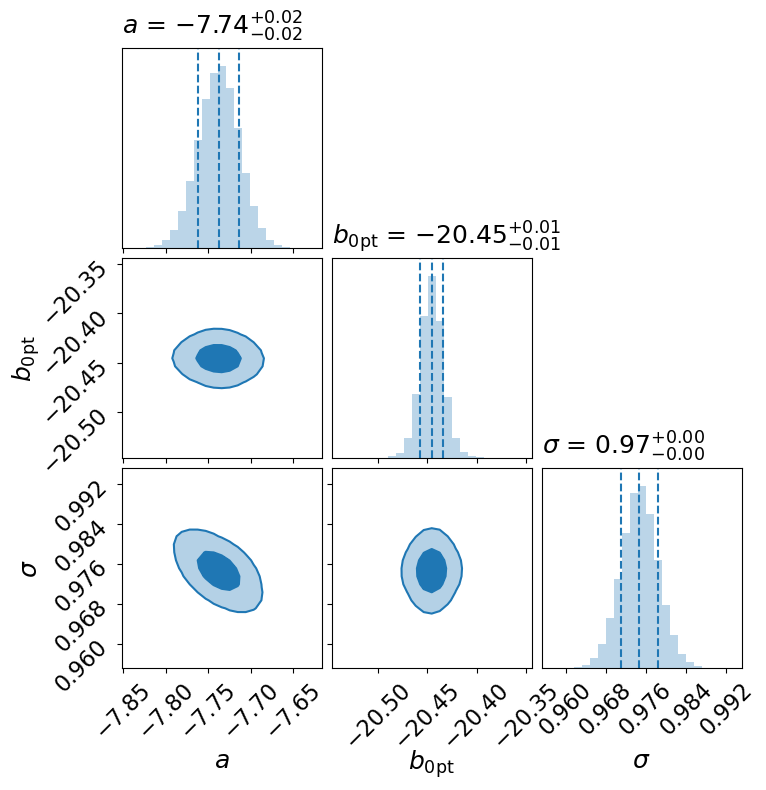

In [78]:
labels  = ['$a$']
labels += ['$b_{0\mathrm{pt}}$']
labels += [r'$\sigma$']

param_indices = [0, 1, tfr_mcmc_samples.T.shape[1] - 1]


fig = corner(tfr_mcmc_samples.T[:, param_indices], bins=25, smooth=1,
#              range=[[1.9, 2.4], [0.75, 1.1], [0.1, 0.3]],   # Range for a, b, sigma. Adjust as needed.
             labels=labels,
             label_kwargs={'fontsize':18},
             labelpad=0.1,
             levels=(1-np.exp(-0.5), 1-np.exp(-2)),
             quantiles=[0.16, 0.5, 0.84],
             color='tab:blue',
             hist_kwargs={'histtype':'stepfilled', 'alpha':0.3},
             plot_datapoints=False,
             fill_contours=True,
             show_titles=True,
             title_kwargs={"fontsize": 18, 'loc':'left', 'pad':10});

for ax in fig.get_axes():
    ax.tick_params(axis='both', which='major', labelsize=16)
fig.savefig('/global/cfs/projectdirs/desi/science/td/pv/tfgalaxies/Y3/Figures/TF_Y3_cluster_calibration_binaryML_corner0_weightsVmax-1.png', dpi=150);

In [51]:
# # Read in the pickle file with the fit

# # Open the pickle file and load the data
# with open('cov_ab_jura_jointTFR_varyV0_binaryML_full_sample.pickle', 'rb') as temp_infile:
#     cov_tfr, tfr_mcmc_samples, logV0 = pickle.load(temp_infile)

# # Now the variables cov_tfr, tfr_mcmc_samples, and logV0 are defined and available to use


### Plot the HyperFit Results

In [53]:
sigma_mcmc = np.percentile(tfr_mcmc_samples[-1], [16., 50., 84.])
a_mcmc = np.percentile(tfr_mcmc_samples[0], [16., 50., 84])
b_mcmc = []
for k in range(1, m+2):
    b_mcmc.append(np.percentile(tfr_mcmc_samples[k], [16., 50., 84.]))
b_mcmc = np.asarray(b_mcmc)

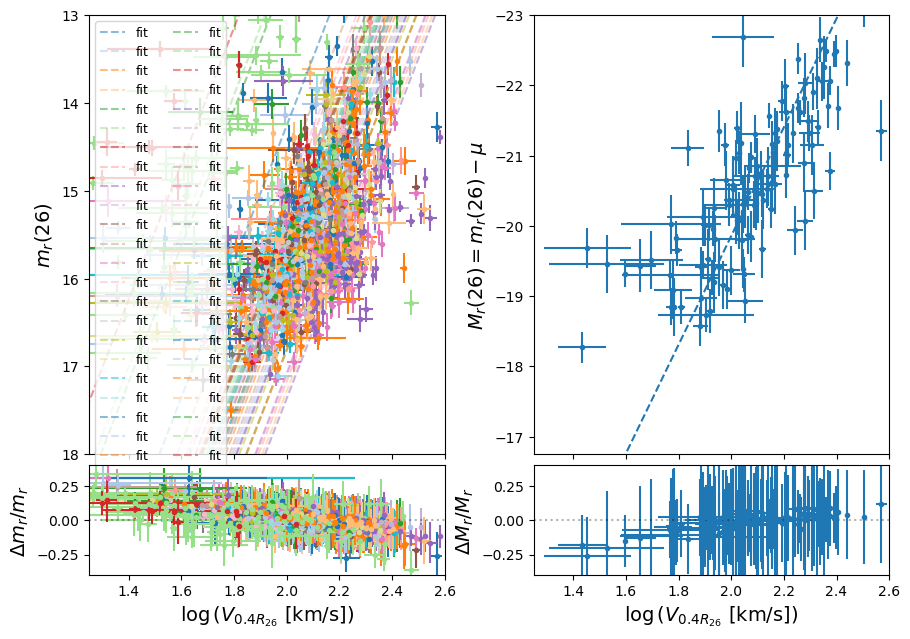

In [81]:
fig, axes = plt.subplots(2,2, figsize=(10,7), sharex=True,
                         gridspec_kw={'height_ratios':[4,1], 'hspace':0.04, 'wspace':0.25})

a_   = a_mcmc[1]
b0pt = b_mcmc[0,1]
b_   = b_mcmc[:,1][1:]

#- Plot clusters
ax = axes[0,0]

_logv = np.arange(0, 3, 0.1) - logV0
for k in range(m):
    eb = ax.errorbar(x=logV[k+1] + logV0, y=mag[k+1], xerr=logV_err[k+1], yerr=mag_err[k+1],
                     fmt='.', )
                     # label=f'{_cluster_ids[k]}')

    ax.plot(_logv + logV0, a_*_logv + b_[k], color=eb[0].get_color(), ls='--', alpha=0.5, label='fit')

ax.set(xlim=[1.25, 2.75],
       ylim=[18, 13])
ax.set_ylabel(r'$m_r (26)$', fontsize=14)
ax.legend(loc='upper left', fontsize=9, ncol=2);

#- Plot calibrators
ax = axes[0,1]
eb = ax.errorbar(x=logV[0] + logV0, y=mag[0], xerr=logV_err[0], yerr=mag_err[0],
                 fmt='.', label=f'0-pt')

ax.plot(_logv + logV0, a_*_logv + b0pt, color=eb[0].get_color(), ls='--', label='fit')
ax.set(xlim=[1.25, 2.75],
       ylim=[-16.75, -23])
ax.set_ylabel(r'$M_r(26) = m_r(26) - \mu$', fontsize=14)
# ax.legend(loc='upper left', fontsize=9, ncol=2)

#- Plot residuals: clusters
ax = axes[1,0]

for k in range(m):
    logv_obs = logV[k+1]
    m_obs = mag[k+1]
    m_exp = (a_*logv_obs + b_[k])
    eb = ax.errorbar(x=logv_obs + logV0, y=(m_exp-m_obs)/m_exp, xerr=logV_err[k+1], yerr=mag_err[k+1],
                     fmt='.', label=f'{_cluster_ids[k]}')

ax.axhline(0, ls=':', color='k', alpha=0.3)

ax.set(xlim=[1.25, 2.6],
       ylim=[-0.4, 0.4])
ax.set_xlabel(r'$\log{(V_{0.4R_{26}}~[\mathrm{km/s}]}$)', fontsize=14)
ax.set_ylabel(r'$\Delta m_r/m_r$', fontsize=14)

#- Plot residuals: calibrators
ax = axes[1,1]

logv_obs = logV[0]
m_obs = mag[0]
m_exp = (a_*logv_obs + b0pt)

b = ax.errorbar(x=logv_obs + logV0, y=(m_exp-m_obs)/m_exp, xerr=logV_err[0], yerr=mag_err[0],
                     fmt='.', label=f'0-pt')
ax.axhline(0, ls=':', color='k', alpha=0.3)

ax.set(xlim=[1.25, 2.6],
       ylim=[-0.4, 0.4])
ax.set_xlabel(r'$\log{(V_{0.4R_{26}}~[\mathrm{km/s}]}$)', fontsize=14)
ax.set_ylabel(r'$\Delta M_r/M_r$', fontsize=14)

fig.subplots_adjust(left=0.1, bottom=0.1, top=0.9, right=0.9);
fig.savefig('Figures/TF_Y3_cluster_calibration_0pt_binaryML_fit_wightsVmax-1.png', dpi=150)

IndexError: index 5 is out of bounds for axis 0 with size 5

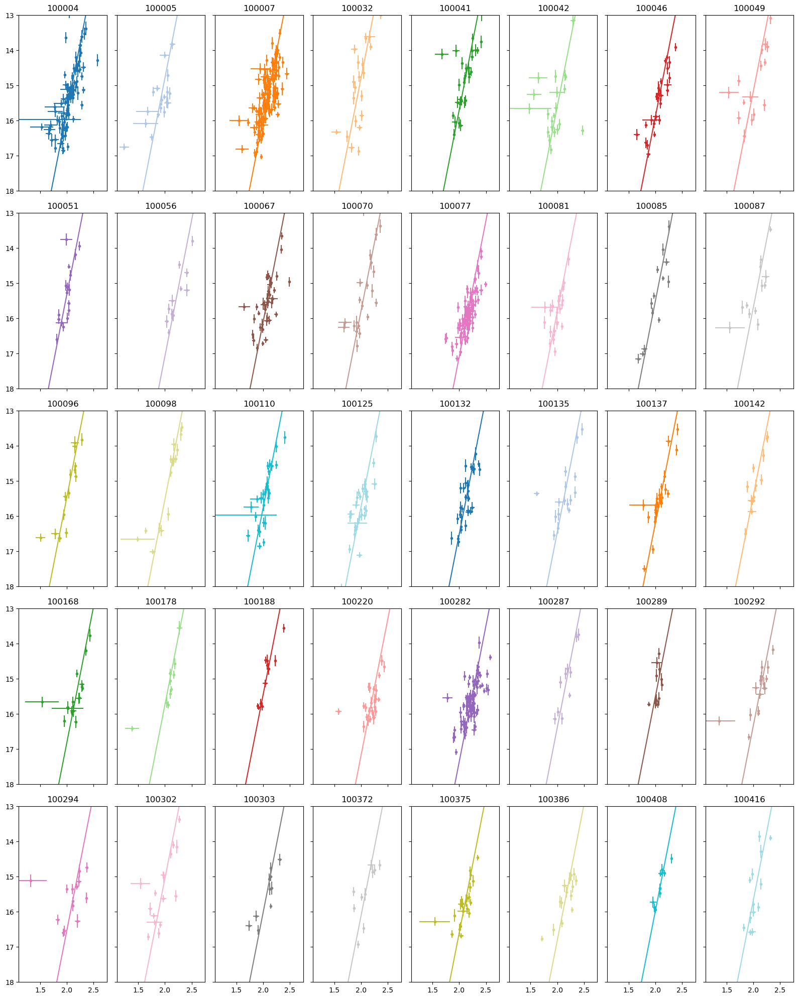

In [61]:
fig, axs = plt.subplots(nrows= int(len(_cluster_ids)/8), ncols=8, sharex=True, sharey=True, figsize = (16,20), tight_layout=False)

color = iter(plt.get_cmap('tab20').colors)
for i in range(m):
    c = plt.get_cmap('tab20').colors[i % 20]
    
    row = int(i/8)
    col = i%8
    
    eb = axs[row,col].errorbar(logV[i+1] + logV0, mag[i+1], xerr=logV_err[i+1], yerr=mag_err[i+1], fmt='.', color=c)
    axs[row,col].plot(_logv + logV0, a_*_logv + b_[i], color=c)
    
    axs[row,col].set(xlim=[1.1, 2.75], ylim=[18, 13], title=f'{_cluster_ids[i]}')
    
fig.supxlabel(r'$\log{(V_{0.4R_{26}}~[\mathrm{km/s}]}$)')
fig.supylabel(r'$m_r (26)$');
# plt.savefig('Figures/Y3_Individual_Cluster_Fits_full_sample.png')

## Check for Dwarf Galaxies

In [62]:
logV_n17 = (-17 - b0pt)/a_ + logV0
# b_perp = -17 + (logV_n17 - logV0)/a_
# b_perp

mr_n17 = a_*(logV_n17 - logV0) + b_
b_perp = mr_n17 + (logV_n17 - logV0)/a_

print(10**logV_n17, 'km/s')

42.74889633724983 km/s


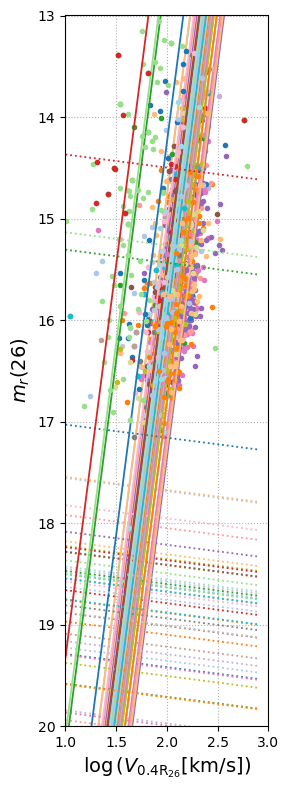

In [67]:
plt.figure(figsize=(4,8), tight_layout=True)

ax = plt.gca()

plt.grid(ls=':')

for k in range(m):
    eb = plt.plot(logV[k+1] + logV0, mag[k+1], '.', label=f'{_cluster_ids[k]}')
    plt.plot(_logv + logV0, a_*_logv + b_[k], color=eb[0].get_color(), marker='None', ls='-', lw=1.3)
    plt.plot(_logv + logV0, -_logv/a_ + b_perp[k], color=eb[0].get_color(), marker='None', ls=':', lw=1.3)
    # plt.hlines(m_dwarf_clusters[_cluster_ids[k]], 1.25, 2.75, colors=eb[0].get_color(), linestyles='dashed')
    
plt.xlabel(r'$\log{(V_\mathrm{0.4R_{26}} [\mathrm{km/s}])}$', fontsize=14)
plt.ylabel(r'$m_r (26)$', fontsize=14)

# plt.legend(bbox_to_anchor=(1.05,1), loc='upper left', borderaxespad=0)

plt.xlim(1, 3)
plt.ylim(20, 13)

plt.gca().set_aspect('equal');

In [84]:
dwarfs = np.zeros(len(caltab), dtype=bool)

for i in range(m):
    # Retrieve this cluster's nest ID
    nestid = _cluster_ids[i]
    
    # Find all galaxies in this cluster
    cluster_gal_idx = caltab['CLUSTER_ID'] == nestid
    
    # Find which of these cluster galaxies are dwarfs
    cluster_dwarfs = (caltab['R_MAG_SB26_CORR'][cluster_gal_idx] - caltab['R_MAG_SB26_ERR_CORR'][cluster_gal_idx]) > (-(np.log10(caltab['V_0p4R26'][cluster_gal_idx]) - logV0)/a_ + b_perp[k])
    
    # Set the boolean correctly
    dwarfs[cluster_gal_idx] = cluster_dwarfs
    
caltab_bright = caltab[~dwarfs]

print(np.sum(dwarfs))

985
